# AV02 - Previsão de retornos diários de ações do Ibovespa com LSTM

Respondendo duas perguntas de imediato:
- Por que retornos e não preços? Os preços de uma ação podem ser interpretados como um passeio aleatório, comportamento de dados em que geralmente o melhor modelo para prever o próximo passo é simplesmente repetir o anterior. Random walks tem alta correlação entre a série e a própria série atrasada, indicando que o passado seria útil para prever o futuro, mas a correlação tem mais a ver com a tendência do que com poder preditivo real. Uma série de retornos, estacionária, tem correlação irrelevante com ela mesma, mas tem mais poder preditivo real na decisão de comprar ou vender uma ação baseando-se nos movimentos dela, e melhor ainda se for utilizada uma classificação dos movimentos em vez de uma previsão numérica dos retornos, o que nos leva à paóxima questão.
- Por que classificação e não regressão? Como indicado por (Enke, 2005) https://www.sciencedirect.com/science/article/abs/pii/S0957417405001156, uma estratégia baseada em classificação da direção dos retornos tem um melhor ganho ajustado ao risco. Uma classificação positiva ou negativa em relação a se uma ação terá retorno positivo ou negativo transforma a saída do modelo em uma informação acionável, além de que tentar prever um valor numérico em uma série altamente volátil é mais difícil do que apenas dizer a direção do retorno.

## Importando dados e libs

In [145]:
# data
import pandas as pd
import plotly.express as px
from pandas import Timedelta
import matplotlib.pyplot as plt
import seaborn as sns

# math
import numpy as np
import math
from math import floor, ceil
import random

# stats, metrics, model selection
from pandas.plotting import autocorrelation_plot
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from scipy.stats import kstest, shapiro, pearsonr
from statsmodels.tsa.stattools import adfuller, pacf, acf
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, make_scorer
from sklearn.model_selection import BaseCrossValidator
from sklearn.preprocessing import StandardScaler

# models
# import pmdarima as pm
import tensorflow as tf
from tensorflow.keras.layers import LSTM, Input, Dense, GRU
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping

RANDOM_STATE = 21

np.random.seed(RANDOM_STATE)
random.seed(RANDOM_STATE)
tf.random.set_seed(RANDOM_STATE)


In [2]:
abev3 = pd.read_csv("./av02_lstm/stocks/ABEV3.csv")
bbdc3 = pd.read_csv("./av02_lstm/stocks/BBDC3.csv")
itsa3 = pd.read_csv("./av02_lstm/stocks/ITSA3.csv")
itub3 = pd.read_csv("./av02_lstm/stocks/ITUB3.csv")
wege3 = pd.read_csv("./av02_lstm/stocks/WEGE3.csv")

In [3]:
abev3.head()

,Date,Price,Open,High,Low,Vol.,Change %
0,10/04/2024,13.28,13.26,13.45,13.17,36.59M,-0.90%
1,10/03/2024,13.40,13.55,13.63,13.40,44.99M,-2.33%
2,10/02/2024,13.72,13.70,13.85,13.61,51.03M,0.88%
3,10/01/2024,13.60,13.20,13.72,13.13,65.79M,3.98%
4,09/30/2024,13.08,12.94,13.17,12.90,31.05M,1.24%


In [4]:
bbdc3.head()

,Date,Price,Open,High,Low,Vol.,Change %
0,10/04/2024,13.29,13.19,13.42,13.10,5.32M,0.30%
1,10/03/2024,13.25,13.28,13.42,13.14,5.28M,-0.97%
2,10/02/2024,13.38,13.30,13.54,13.27,8.59M,3.22%
3,10/01/2024,12.96,13.04,13.11,12.84,7.16M,0.54%
4,09/30/2024,12.89,13.05,13.08,12.87,5.90M,-1.13%


In [5]:
itsa3.head()

,Date,Price,Open,High,Low,Vol.,Change %
0,10/04/2024,10.63,10.57,10.68,10.55,114.10K,0.76%
1,10/03/2024,10.55,10.91,10.91,10.55,294.10K,-3.21%
2,10/02/2024,10.90,10.90,11.05,10.90,162.60K,0.46%
3,10/01/2024,10.85,11.07,11.07,10.79,432.30K,-2.08%
4,09/30/2024,11.08,11.12,11.16,11.00,122.70K,-0.63%


In [6]:
itub3.head()

,Date,Price,Open,High,Low,Vol.,Change %
0,10/04/2024,30.46,30.39,30.60,30.27,310.50K,0.20%
1,10/03/2024,30.40,31.01,31.02,30.30,386.90K,-2.22%
2,10/02/2024,31.09,30.90,31.43,30.90,343.80K,0.65%
3,10/01/2024,30.89,31.41,31.49,30.77,467.50K,-1.66%
4,09/30/2024,31.41,31.86,32.01,31.41,428.40K,-1.50%


In [7]:
wege3.head()

,Date,Price,Open,High,Low,Vol.,Change %
0,10/04/2024,54.50,54.36,54.98,54.26,4.82M,-0.18%
1,10/03/2024,54.60,54.76,55.00,53.95,4.47M,-1.36%
2,10/02/2024,55.35,56.13,56.37,55.14,5.12M,-0.95%
3,10/01/2024,55.88,55.00,56.22,54.80,8.03M,2.74%
4,09/30/2024,54.39,55.63,56.24,54.39,6.41M,-2.81%


Filtrando dataframes e convertendo data em Index

In [8]:
START_DATE = "2007-10-04" # first register of price for WEGE3 -> latest of series
END_DATE = "2024-10-04"

In [9]:
abev3 = abev3.filter(["Date", "Price"], axis=1)
bbdc3 = bbdc3.filter(["Date", "Price"], axis=1)
itsa3 = itsa3.filter(["Date", "Price"], axis=1)
itub3 = itub3.filter(["Date", "Price"], axis=1)
wege3 = wege3.filter(["Date", "Price"], axis=1)

abev3['Date'] = pd.to_datetime(abev3['Date'], format='%m/%d/%Y')
bbdc3['Date'] = pd.to_datetime(bbdc3['Date'], format='%m/%d/%Y')
itsa3['Date'] = pd.to_datetime(itsa3['Date'], format='%m/%d/%Y')
itub3['Date'] = pd.to_datetime(itub3['Date'], format='%m/%d/%Y')
wege3['Date'] = pd.to_datetime(wege3['Date'], format='%m/%d/%Y')

In [10]:
abev3.head()

,Date,Price
0,2024-10-04,13.28
1,2024-10-03,13.40
2,2024-10-02,13.72
3,2024-10-01,13.60
4,2024-09-30,13.08


In [11]:
abev3 = abev3[(abev3["Date"] >= START_DATE) & (abev3["Date"] <= END_DATE)]
abev3.tail()

,Date,Price
4210,2007-10-10,3.04
4211,2007-10-09,3.08
4212,2007-10-08,3.06
4213,2007-10-05,3.06
4214,2007-10-04,2.99


In [12]:
bbdc3 = bbdc3[(bbdc3["Date"] >= START_DATE) & (bbdc3["Date"] <= END_DATE)]
bbdc3.tail()

,Date,Price
4211,2007-10-10,6.35
4212,2007-10-09,6.38
4213,2007-10-08,6.31
4214,2007-10-05,6.30
4215,2007-10-04,6.00


In [13]:
itsa3 = itsa3[(itsa3["Date"] >= START_DATE) & (itsa3["Date"] <= END_DATE)]
itsa3.tail()

,Date,Price
4151,2007-10-10,3.43
4152,2007-10-09,3.44
4153,2007-10-08,3.43
4154,2007-10-05,3.52
4155,2007-10-04,3.48


In [14]:
itub3 = itub3[(itub3["Date"] >= START_DATE) & (itub3["Date"] <= END_DATE)]
itub3.tail()

,Date,Price
4210,2007-10-10,8.15
4211,2007-10-09,8.30
4212,2007-10-08,7.95
4213,2007-10-05,7.86
4214,2007-10-04,7.44


In [15]:
wege3 = wege3[(wege3["Date"] >= START_DATE) & (wege3["Date"] <= END_DATE)]
wege3.tail()

,Date,Price
4210,2007-10-10,2.43
4211,2007-10-09,2.44
4212,2007-10-08,2.45
4213,2007-10-05,2.43
4214,2007-10-04,2.40


In [16]:
abev3.set_index('Date', inplace=True)
bbdc3.set_index('Date', inplace=True)
itsa3.set_index('Date', inplace=True)
itub3.set_index('Date', inplace=True)
wege3.set_index('Date', inplace=True)

In [17]:
def print_line_series(df: pd.DataFrame, title: str = "Series"):
    plt.figure(figsize=(30, 10))
    plt.title(title)
    plt.plot(df.Price)

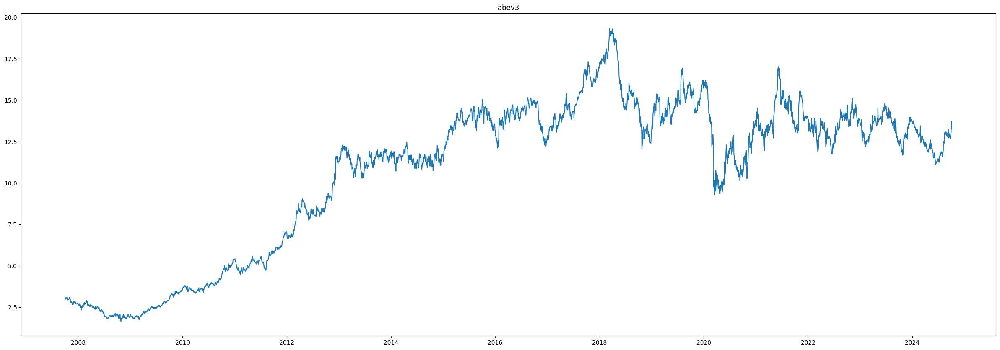

In [18]:
print_line_series(abev3, "abev3")

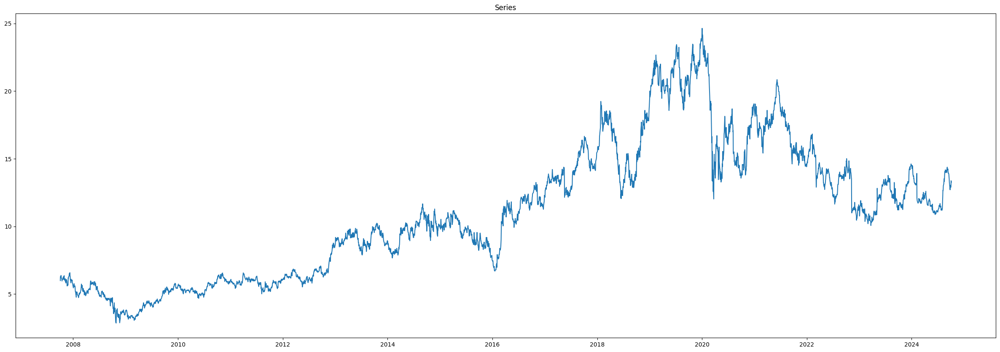

In [19]:
print_line_series(bbdc3)

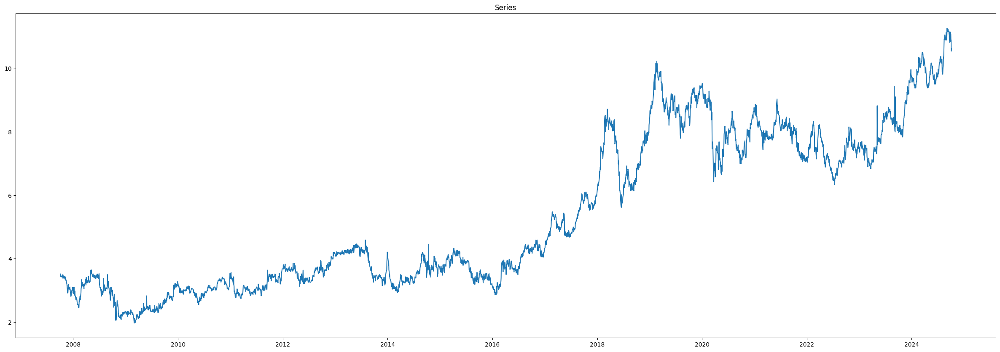

In [20]:
print_line_series(itsa3)

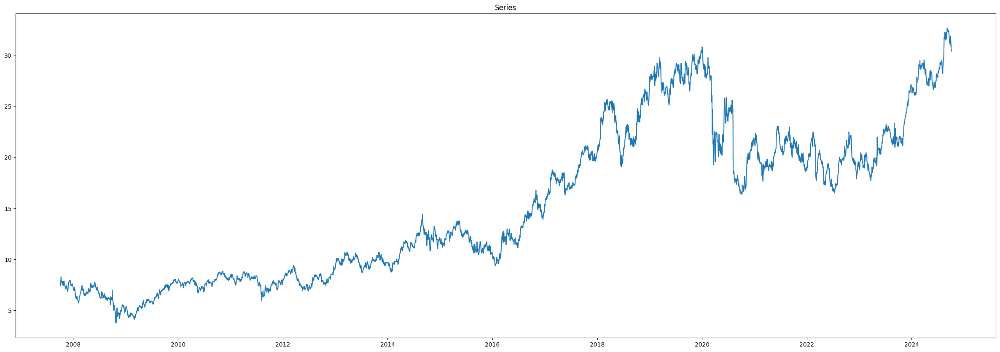

In [21]:
print_line_series(itub3)

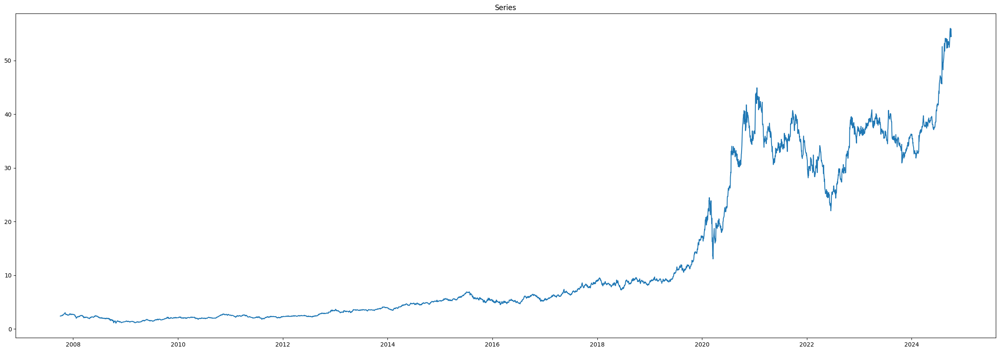

In [22]:
print_line_series(wege3)

## Lidando com dados faltantes

In [23]:
abev3.isna().sum()

Price    0
dtype: int64

In [24]:
bbdc3.isna().sum()

Price    0
dtype: int64

In [25]:
itsa3.isna().sum()

Price    0
dtype: int64

In [26]:
itub3.isna().sum()

Price    0
dtype: int64

In [27]:
wege3.isna().sum()

Price    0
dtype: int64

In [28]:
print(len(abev3))
print(len(bbdc3))
print(len(itub3))
print(len(itsa3))
print(len(wege3))

4215
4216
4215
4156
4215


Não há NaN nas séries, mas há discrepâncias no eixo temporal. Concatenando os DFs irá juntar o eixo temporal de todos eles, e as séries que não houverem registros de dias específicos passaram a ter NaN

In [29]:
stocks_df = pd.concat(
    [
        abev3.add_suffix("_abev3"), 
        bbdc3.add_suffix("_bbdc3"), 
        itub3.add_suffix("_itub3"), 
        itsa3.add_suffix("_itsa3"), 
        wege3.add_suffix("_wege3")
    ], 
    axis=1
)
stocks_df.head(10)

,Price_abev3,Price_bbdc3,Price_itub3,Price_itsa3,Price_wege3
Date,,,,,
2007-10-04,2.99,6.00,7.44,3.48,2.40
2007-10-05,3.06,6.30,7.86,3.52,2.43
2007-10-08,3.06,6.31,7.95,3.43,2.45
2007-10-09,3.08,6.38,8.30,3.44,2.44
2007-10-10,3.04,6.35,8.15,3.43,2.43
2007-10-11,3.08,6.20,7.87,3.43,2.44
2007-10-15,3.02,6.09,7.75,3.43,2.47
2007-10-16,2.94,5.97,7.61,3.48,2.47
2007-10-17,3.06,6.09,7.86,3.48,2.57


In [30]:
stocks_df.isna().sum()

Price_abev3     1
Price_bbdc3     0
Price_itub3     1
Price_itsa3    60
Price_wege3     1
dtype: int64

In [31]:
def count_largest_missing_interval(df: pd.DataFrame, column: str):
    # Step 1: Create a mask for missing values in the specified column.
    mask = df[column].isna()

    # Step 2: Identify consecutive groups of NaNs using cumsum on the inverted mask.
    # Use (~mask).cumsum() to create a unique group number for consecutive NaNs.
    groups = (~mask).cumsum()

    # Step 3: Filter only the groups corresponding to NaN values.
    nan_groups = stocks_df[mask].groupby(groups).size()

    # Step 4: Find the maximum size of consecutive NaNs.
    max_nan_sequence_length = nan_groups.max() if not nan_groups.empty else 0

    # Step 5: Get the index range for this sequence if it exists.
    if max_nan_sequence_length > 0:
        longest_nan_group = nan_groups.idxmax()
        start_date = df[mask & (groups == longest_nan_group)].index.min()
        end_date = df[mask & (groups == longest_nan_group)].index.max()
        print(f"The length of the largest consecutive sequence of missing values in {column} is: {max_nan_sequence_length}")
        print(f"The time range for this sequence is from {start_date} to {end_date}")
    else:
        print(f"No missing values found in the {column} time series.")
    print("\n")


In [32]:
for col in [col for col in stocks_df.columns.tolist() if "Price_" in col]:
    count_largest_missing_interval(stocks_df, col)

The length of the largest consecutive sequence of missing values in Price_abev3 is: 1
The time range for this sequence is from 2024-05-25 00:00:00 to 2024-05-25 00:00:00


No missing values found in the Price_bbdc3 time series.


The length of the largest consecutive sequence of missing values in Price_itub3 is: 1
The time range for this sequence is from 2007-10-18 00:00:00 to 2007-10-18 00:00:00


The length of the largest consecutive sequence of missing values in Price_itsa3 is: 3
The time range for this sequence is from 2008-10-03 00:00:00 to 2008-10-07 00:00:00


The length of the largest consecutive sequence of missing values in Price_wege3 is: 1
The time range for this sequence is from 2024-05-25 00:00:00 to 2024-05-25 00:00:00




Considerando que a série de preços de ações se comporta de forma semelhante a passeios aleatórios com inclinação positiva, a suposição de que o melhor modelo para prever o próximo passo é repetir o anterior não se aplica. Nesse caso, será aplicada uma interpolação linear, considerando que os valores ausentes não constituem intervalos maiores que 3 valores sequenciais. https://people.duke.edu/~rnau/Notes_on_the_random_walk_model--Robert_Nau.pdf


In [33]:
stocks_df = stocks_df.interpolate(method="linear")

In [34]:
stocks_df.isna().sum()

Price_abev3    0
Price_bbdc3    0
Price_itub3    0
Price_itsa3    0
Price_wege3    0
dtype: int64

## Exploração

In [35]:
def compute_returns_for_prices(df: pd.DataFrame, column_names: list[str]):
    for column in column_names:
        new_name = column.split("_")[1]
        df[f"Return_{new_name}"] = (df[column] / df[column].shift(1)) - 1
        df.dropna(inplace=True)

In [36]:
def normal_komolgorov_smirnov(array: np.ndarray):
    ks_statistic, p_value = kstest(array, 'norm')

    print(f"KS Statistic: {ks_statistic}")
    print(f"P-Value: {p_value}")

    if p_value < 0.05:
        print("H0 rejected, distribution can't be said Normal")
    else:
        print("H0 is not rejected, possibly normal distribution")
    
    return ks_statistic, p_value

In [37]:
def shapiro_wilk_gaussian_test(array: np.ndarray):
    sw_stat, p_value = shapiro(array)

    print(f"Shapiro-Wilk Statistic: {sw_stat}")
    print(f"P-Value: {p_value}")

    if p_value < 0.05:
        print("H0 rejected, distribution can't be said Normal")
    else:
        print("Fail to reject H0, possibly normal distribution")
    
    return sw_stat, p_value

In [38]:
def adf_test(array: np.ndarray):
    result = adfuller(array)

    adf_stat = result[0]
    p_value = result[1]
    critical_values = result[4]

    print('ADF Statistic:', adf_stat)
    print('p-value:', p_value)
    print('Critical Values:')

    if p_value < 0.05:
        print("H0 rejected. Series is possibly stationary")
    else:
        print("H0 not rejected. Series is possibly non-stationary")

    return adf_stat, p_value

In [39]:
compute_returns_for_prices(stocks_df, stocks_df.columns.tolist())
stocks_df.tail()

,Price_abev3,Price_bbdc3,Price_itub3,Price_itsa3,Price_wege3,Return_abev3,Return_bbdc3,Return_itub3,Return_itsa3,Return_wege3
Date,,,,,,,,,,
2024-09-30,13.08,12.89,31.41,11.08,54.39,0.012384,-0.011503,-0.015052,-0.006278,-0.028056
2024-10-01,13.60,12.96,30.89,10.85,55.88,0.039755,0.005431,-0.016555,-0.020758,0.027395
2024-10-02,13.72,13.38,31.09,10.90,55.35,0.008824,0.032407,0.006475,0.004608,-0.009485
2024-10-03,13.40,13.25,30.40,10.55,54.60,-0.023324,-0.009716,-0.022194,-0.032110,-0.013550
2024-10-04,13.28,13.29,30.46,10.63,54.50,-0.008955,0.003019,0.001974,0.007583,-0.001832


ADF Statistic: -11.426433608419604
p-value: 6.6778425989667674e-21
Critical Values:
H0 rejected. Series is possibly stationary
ADF Statistic: -28.644695020965834
p-value: 0.0
Critical Values:
H0 rejected. Series is possibly stationary
ADF Statistic: -29.54867045768925
p-value: 0.0
Critical Values:
H0 rejected. Series is possibly stationary
ADF Statistic: -26.05427533728547
p-value: 0.0
Critical Values:
H0 rejected. Series is possibly stationary
ADF Statistic: -13.788318518029264
p-value: 9.024511198353992e-26
Critical Values:
H0 rejected. Series is possibly stationary


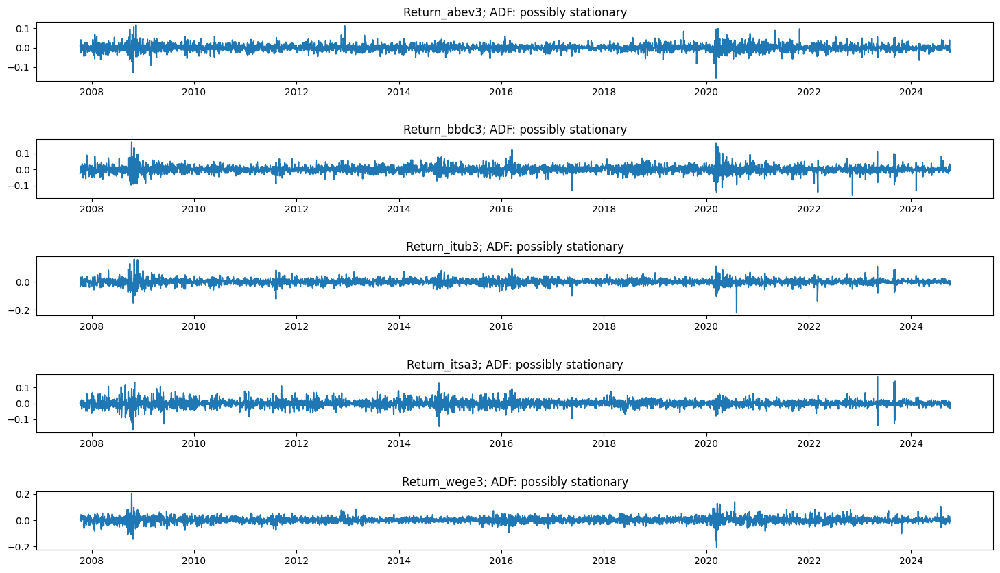

In [40]:
plt.figure(figsize=(18, 10))
for i, col in enumerate([col for col in stocks_df.columns.tolist() if "Return_" in col]):

    _, p_value = adf_test(stocks_df[col])

    plt.subplot(5, 1, i+1)
    plt.axis(True)
    plt.plot(stocks_df[col])
    plt.title(f"{col}; ADF: {'possibly stationary' if p_value < 0.05 else 'possibly non-stationary'}")
    plt.subplots_adjust(wspace=0.2, hspace=1.0)

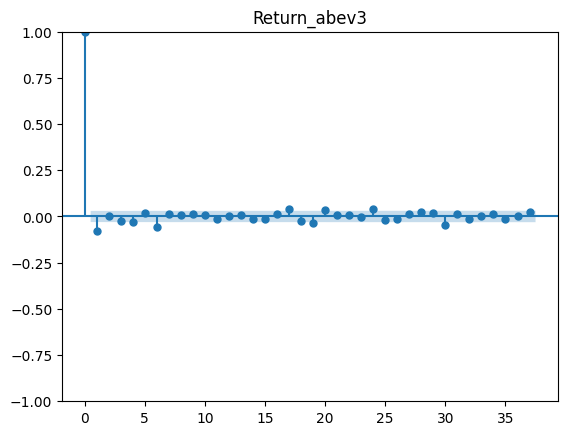

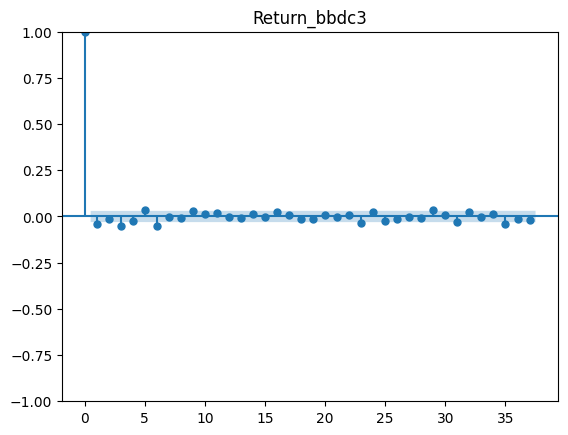

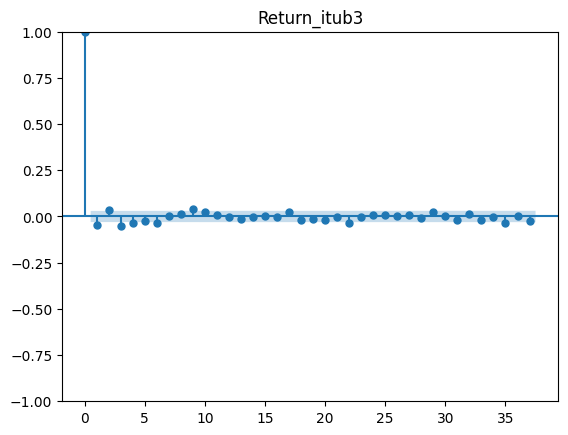

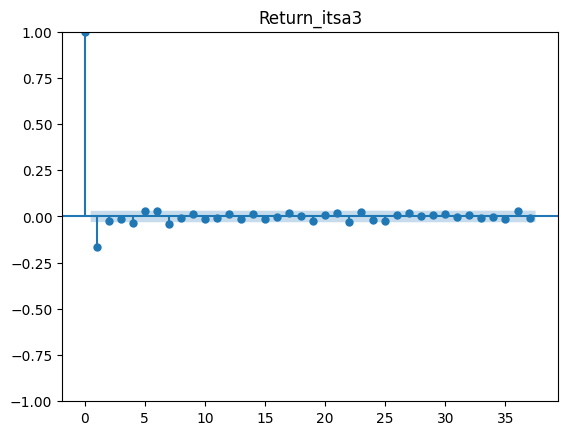

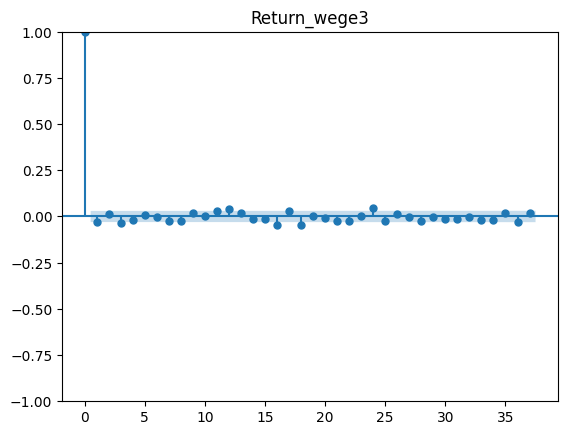

In [41]:
for i, col in enumerate([col for col in stocks_df.columns.tolist() if "Return_" in col]):

    # print(acf(stocks_df[col]))
    plot_acf(stocks_df[col], title=col)
    plt.subplots_adjust(wspace=0.2, hspace=1.0)

Shapiro-Wilk Statistic: 0.9404390537904097
P-Value: 3.4647563709880827e-38
H0 rejected, distribution can't be said Normal
Shapiro-Wilk Statistic: 0.9348584346672091
P-Value: 1.636872547307974e-39
H0 rejected, distribution can't be said Normal
Shapiro-Wilk Statistic: 0.928262637934504
P-Value: 5.755061300774304e-41
H0 rejected, distribution can't be said Normal
Shapiro-Wilk Statistic: 0.9314833558580566
P-Value: 2.8571418135973056e-40
H0 rejected, distribution can't be said Normal
Shapiro-Wilk Statistic: 0.938757809286279
P-Value: 1.349529728620439e-38
H0 rejected, distribution can't be said Normal


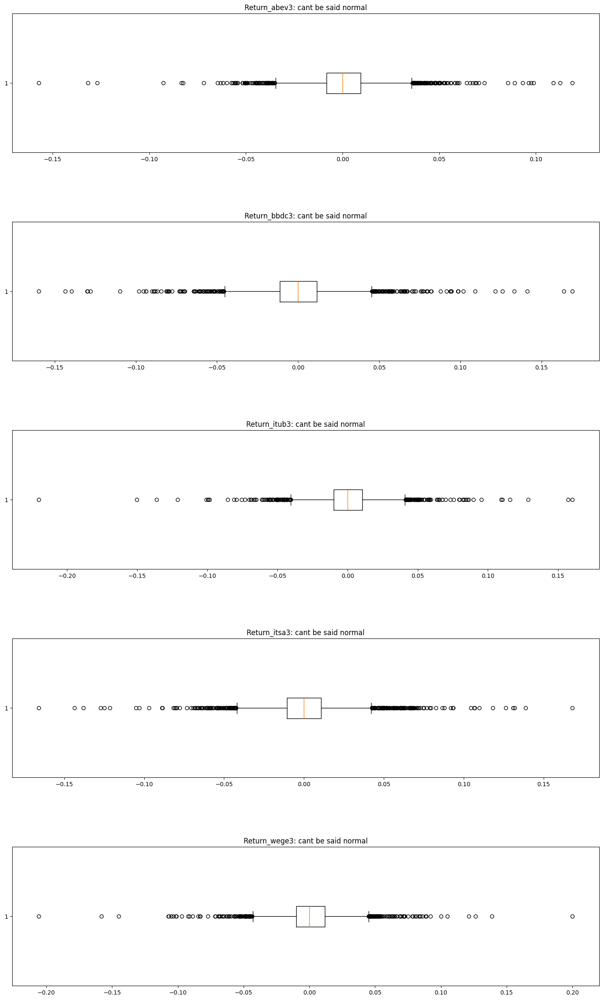

In [42]:
plt.figure(figsize=(18, 30))
for i, col in enumerate([col for col in stocks_df.columns.tolist() if "Return_" in col]):

    _, p_value = shapiro_wilk_gaussian_test(stocks_df[col])

    plt.subplot(5, 1, i+1)
    plt.axis(True)
    plt.boxplot(stocks_df[col], vert=False)
    plt.title(f"{col}: {'cant be said normal' if p_value < 0.05 else 'possibly normal'}")
    plt.subplots_adjust(wspace=0.2, hspace=0.5)

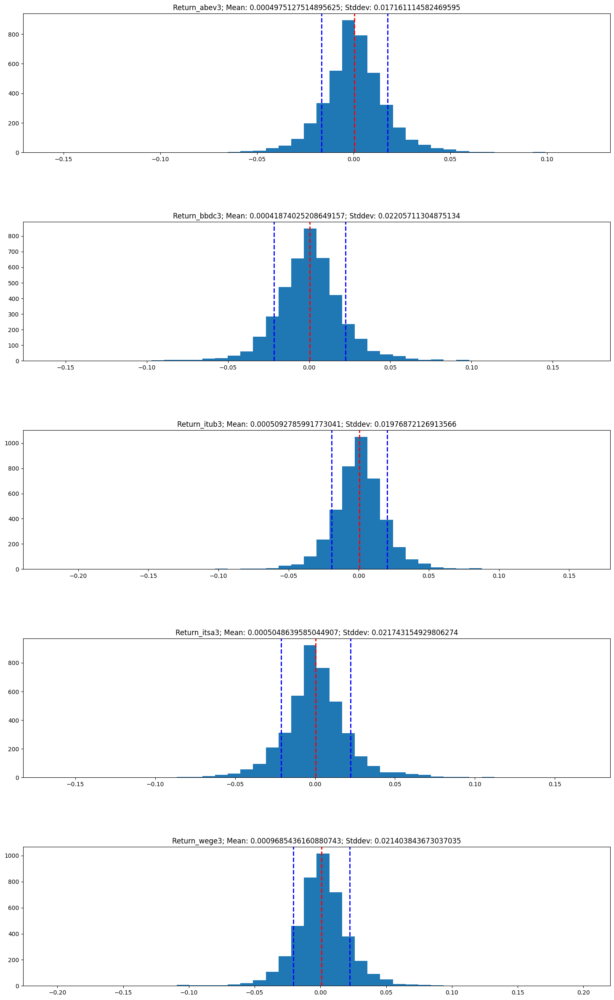

In [43]:
plt.figure(figsize=(18, 30))
for i, col in enumerate([col for col in stocks_df.columns.tolist() if "Return_" in col]):

    mean = np.array(stocks_df[col]).mean()
    std = np.array(stocks_df[col]).std()

    plt.subplot(5, 1, i+1)
    plt.axis(True)
    plt.hist(stocks_df[col], bins=math.floor(len(stocks_df)/100))
    plt.axvline(mean, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean:.2f}')
    plt.axvline(mean + std, color='blue', linestyle='dashed', linewidth=2, label=f'Mean + 1 Std Dev: {mean + std:.2f}')
    plt.axvline(mean - std, color='blue', linestyle='dashed', linewidth=2, label=f'Mean - 1 Std Dev: {mean - std:.2f}')
    plt.title(f"{col}; Mean: {mean}; Stddev: {std}")
    plt.subplots_adjust(wspace=0.2, hspace=0.5)

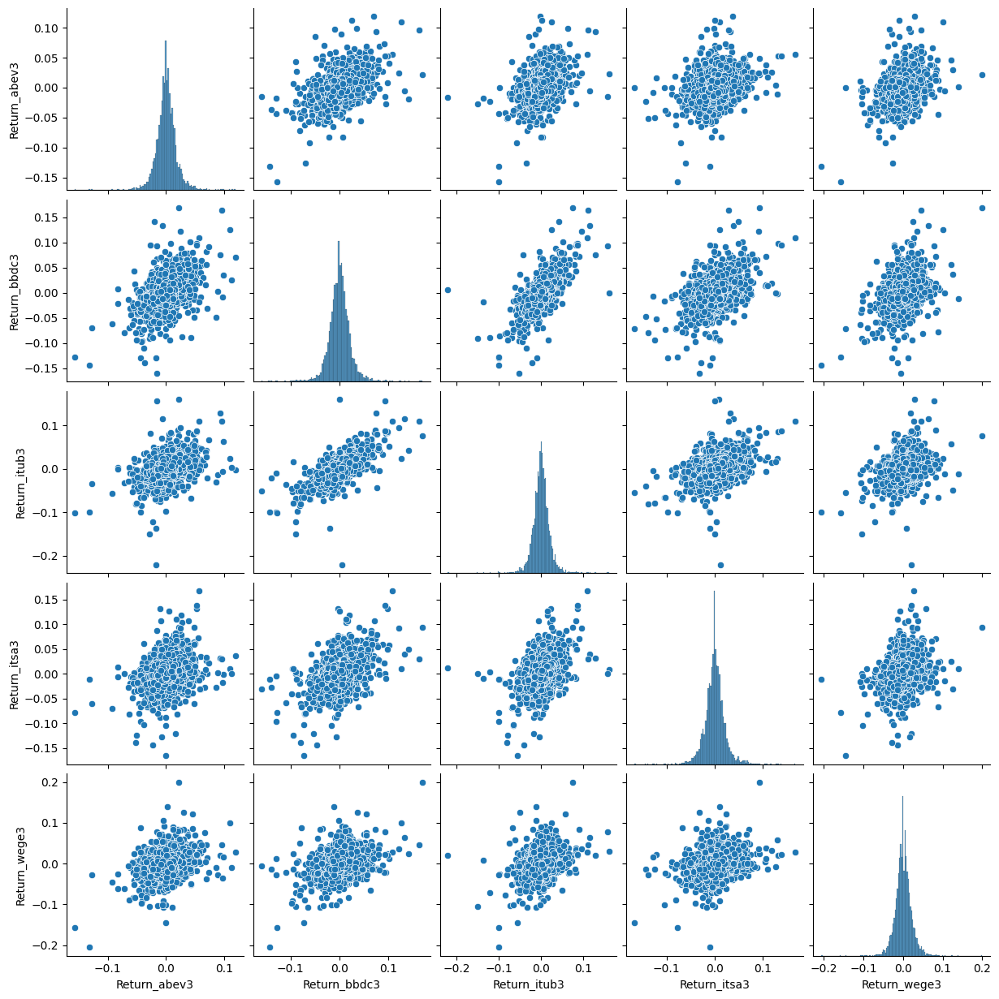

In [44]:
sns.pairplot(stocks_df[[col for col in stocks_df.columns.tolist() if "Return" in col]])

<Axes: >

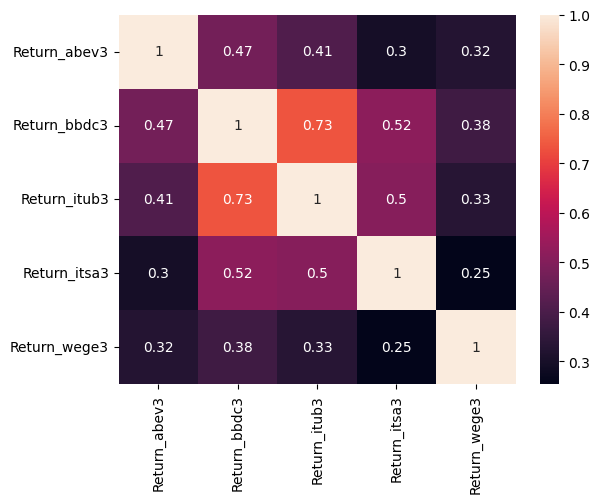

In [45]:
sns.heatmap(stocks_df[[col for col in stocks_df.columns.tolist() if "Return" in col]].corr(), annot=True)

O pairplot e o heatmap de correlação apontam que dificilmente qualquer uma série teria poder preditivo linear sobre as outras por não apresentarem uma correlação de Pearson significativa, exceto itub3 e bbdc3, o que faz sentido pois são duas ações do mesmo setor (bancário).

In [46]:
return_cols_names = filter(lambda x: "Return_" in x, stocks_df.columns.tolist())
stocks_df[return_cols_names].describe()

,Return_abev3,Return_bbdc3,Return_itub3,Return_itsa3,Return_wege3
count,4211.000000,4211.000000,4211.000000,4211.000000,4211.000000
mean,0.000498,0.000419,0.000509,0.000505,0.000969
std,0.017163,0.022060,0.019771,0.021746,0.021406
min,-0.157168,-0.159763,-0.220203,-0.165992,-0.205761
25%,-0.008318,-0.011242,-0.009860,-0.010506,-0.010100
50%,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.009434,0.011498,0.010580,0.010674,0.011955
max,0.118919,0.169014,0.160271,0.167989,0.200000


As séries de retornos são todas estacionárias e não seguem uma distribuição normal, de acordo com o teste ADF e o teste de Shapiro-Wilk, com uma média ligeiramente inclinada para o lado positivo. A média positiva indica que essas séries geraram retornos positivos com mais frequência do que negativos, e comprar e manter essas ações durante esse período resultaria, ao final, em um resultado financeiro positivo. Todas as séries têm outliers bem acima e abaixo dos limites, o que pode estar influenciando o teste de Shapiro-Wilk

In [147]:
price_cols = [col for col in stocks_df.columns.tolist() if "Price" in col]
for col in price_cols:
    new_df = pd.DataFrame()
    new_df[col] = stocks_df[col]
    new_df[f"{col}_shifted"] = stocks_df[col].shift(1)
    new_df.dropna(axis=0, inplace=True)
    print(f"corr between {col} and itself lagged: {pearsonr(new_df[col], new_df[f"{col}_shifted"])}")

corr between Price_abev3 and itself lagged: PearsonRResult(statistic=0.9992001497341811, pvalue=0.0)
corr between Price_bbdc3 and itself lagged: PearsonRResult(statistic=0.9986171801430164, pvalue=0.0)
corr between Price_itub3 and itself lagged: PearsonRResult(statistic=0.9991605419974833, pvalue=0.0)
corr between Price_itsa3 and itself lagged: PearsonRResult(statistic=0.9989795140583533, pvalue=0.0)
corr between Price_wege3 and itself lagged: PearsonRResult(statistic=0.9995852267480803, pvalue=0.0)


In [148]:
return_cols = [col for col in stocks_df.columns.tolist() if "Return" in col and "lag" not in col]
for col in return_cols:
    new_df = pd.DataFrame()
    new_df[col] = stocks_df[col]
    new_df[f"{col}_shifted"] = stocks_df[col].shift(1)
    new_df.dropna(axis=0, inplace=True)
    print(f"corr between {col} and itself lagged: {pearsonr(new_df[col], new_df[f"{col}_shifted"])}")

corr between Return_abev3 and itself lagged: PearsonRResult(statistic=-0.07930281344689197, pvalue=2.5756935676892776e-07)
corr between Return_bbdc3 and itself lagged: PearsonRResult(statistic=-0.04024680613016283, pvalue=0.009009931608639065)
corr between Return_itub3 and itself lagged: PearsonRResult(statistic=-0.04745027490549751, pvalue=0.0020727296527194385)
corr between Return_itsa3 and itself lagged: PearsonRResult(statistic=-0.16604608061470372, pvalue=2.0836543654238597e-27)
corr between Return_wege3 and itself lagged: PearsonRResult(statistic=-0.031807285617318506, pvalue=0.039045267191951644)


Reforçando o argumento pró-retornos. As séries de preços tem alta correlação entre a série e a série atrasada, enquanto a série de retornos diferenciada não, mas a alta correlação é devido a tendência linear e não devido a poder preditivo real.

## Montando o dataframe

In [47]:
def compute_lags(df: pd.DataFrame, column_names: list[str], lags: int = 5):
    for col in column_names:
        if "Return" in col:
            for i in range(lags - 1):
                df[f"{col}_lag_{i+1}"] = df[f"{col}"].shift(i+1)

In [48]:
stocks_df.head()

,Price_abev3,Price_bbdc3,Price_itub3,Price_itsa3,Price_wege3,Return_abev3,Return_bbdc3,Return_itub3,Return_itsa3,Return_wege3
Date,,,,,,,,,,
2007-10-11,3.08,6.20,7.87,3.43,2.44,0.013158,-0.023622,-0.034356,0.000000,0.004115
2007-10-15,3.02,6.09,7.75,3.43,2.47,-0.019481,-0.017742,-0.015248,0.000000,0.012295
2007-10-16,2.94,5.97,7.61,3.48,2.47,-0.026490,-0.019704,-0.018065,0.014577,0.000000
2007-10-17,3.06,6.09,7.86,3.48,2.57,0.040816,0.020101,0.032852,0.000000,0.040486
2007-10-18,3.07,6.09,7.69,3.48,2.59,0.003268,0.000000,-0.021628,0.000000,0.007782


In [49]:
def compute_targets(df: pd.DataFrame, column_names: list[str]):
    df["abev3_y"] = df["Return_abev3"].shift(-1) > 0
    df["bbdc3_y"] = df["Return_bbdc3"].shift(-1) > 0
    df["itsa3_y"] = df["Return_itsa3"].shift(-1) > 0
    df["itub3_y"] = df["Return_itub3"].shift(-1) > 0
    df["wege3_y"] = df["Return_wege3"].shift(-1) > 0

In [50]:
compute_targets(stocks_df, stocks_df.columns.tolist())
stocks_df.head(15)

,Price_abev3,Price_bbdc3,Price_itub3,Price_itsa3,Price_wege3,Return_abev3,Return_bbdc3,Return_itub3,Return_itsa3,Return_wege3,abev3_y,bbdc3_y,itsa3_y,itub3_y,wege3_y
Date,,,,,,,,,,,,,,,
2007-10-11,3.08,6.20,7.87,3.43,2.44,0.013158,-0.023622,-0.034356,0.000000,0.004115,False,False,False,False,True
2007-10-15,3.02,6.09,7.75,3.43,2.47,-0.019481,-0.017742,-0.015248,0.000000,0.012295,False,False,True,False,False
2007-10-16,2.94,5.97,7.61,3.48,2.47,-0.026490,-0.019704,-0.018065,0.014577,0.000000,True,True,False,True,True
2007-10-17,3.06,6.09,7.86,3.48,2.57,0.040816,0.020101,0.032852,0.000000,0.040486,True,False,False,False,True
2007-10-18,3.07,6.09,7.69,3.48,2.59,0.003268,0.000000,-0.021628,0.000000,0.007782,False,False,False,False,False
2007-10-19,3.00,6.09,7.52,3.43,2.57,-0.022801,0.000000,-0.022107,-0.014368,-0.007722,False,True,True,True,False
2007-10-22,3.00,6.13,7.57,3.50,2.54,0.000000,0.006568,0.006649,0.020408,-0.011673,False,True,False,True,True
2007-10-23,3.00,6.19,7.70,3.38,2.58,0.000000,0.009788,0.017173,-0.034286,0.015748,False,True,True,False,True
2007-10-24,3.00,6.23,7.59,3.46,2.65,0.000000,0.006462,-0.014286,0.023669,0.027132,False,False,False,False,True


In [51]:
compute_lags(stocks_df, stocks_df.columns.tolist())

stocks_df.head()

,Price_abev3,Price_bbdc3,Price_itub3,Price_itsa3,Price_wege3,Return_abev3,Return_bbdc3,Return_itub3,Return_itsa3,Return_wege3,...,Return_itub3_lag_3,Return_itub3_lag_4,Return_itsa3_lag_1,Return_itsa3_lag_2,Return_itsa3_lag_3,Return_itsa3_lag_4,Return_wege3_lag_1,Return_wege3_lag_2,Return_wege3_lag_3,Return_wege3_lag_4
Date,,,,,,,,,,,,,,,,,,,,,
2007-10-11,3.08,6.20,7.87,3.43,2.44,0.013158,-0.023622,-0.034356,0.000000,0.004115,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2007-10-15,3.02,6.09,7.75,3.43,2.47,-0.019481,-0.017742,-0.015248,0.000000,0.012295,...,NaN,NaN,0.000000,NaN,NaN,NaN,0.004115,NaN,NaN,NaN
2007-10-16,2.94,5.97,7.61,3.48,2.47,-0.026490,-0.019704,-0.018065,0.014577,0.000000,...,NaN,NaN,0.000000,0.000000,NaN,NaN,0.012295,0.004115,NaN,NaN
2007-10-17,3.06,6.09,7.86,3.48,2.57,0.040816,0.020101,0.032852,0.000000,0.040486,...,-0.034356,NaN,0.014577,0.000000,0.0,NaN,0.000000,0.012295,0.004115,NaN
2007-10-18,3.07,6.09,7.69,3.48,2.59,0.003268,0.000000,-0.021628,0.000000,0.007782,...,-0.015248,-0.034356,0.000000,0.014577,0.0,0.0,0.040486,0.000000,0.012295,0.004115


In [52]:
stocks_df[[col for col in stocks_df.columns.tolist() if "abev3" in col]].head()

,Price_abev3,Return_abev3,abev3_y,Return_abev3_lag_1,Return_abev3_lag_2,Return_abev3_lag_3,Return_abev3_lag_4
Date,,,,,,,
2007-10-11,3.08,0.013158,False,NaN,NaN,NaN,NaN
2007-10-15,3.02,-0.019481,False,0.013158,NaN,NaN,NaN
2007-10-16,2.94,-0.026490,True,-0.019481,0.013158,NaN,NaN
2007-10-17,3.06,0.040816,True,-0.026490,-0.019481,0.013158,NaN
2007-10-18,3.07,0.003268,False,0.040816,-0.026490,-0.019481,0.013158


In [53]:
stocks_df[[col for col in stocks_df.columns.tolist() if "abev3" in col or "median" in col]].head(10)

,Price_abev3,Return_abev3,abev3_y,Return_abev3_lag_1,Return_abev3_lag_2,Return_abev3_lag_3,Return_abev3_lag_4
Date,,,,,,,
2007-10-11,3.08,0.013158,False,NaN,NaN,NaN,NaN
2007-10-15,3.02,-0.019481,False,0.013158,NaN,NaN,NaN
2007-10-16,2.94,-0.026490,True,-0.019481,0.013158,NaN,NaN
2007-10-17,3.06,0.040816,True,-0.026490,-0.019481,0.013158,NaN
2007-10-18,3.07,0.003268,False,0.040816,-0.026490,-0.019481,0.013158
2007-10-19,3.00,-0.022801,False,0.003268,0.040816,-0.026490,-0.019481
2007-10-22,3.00,0.000000,False,-0.022801,0.003268,0.040816,-0.026490
2007-10-23,3.00,0.000000,False,0.000000,-0.022801,0.003268,0.040816
2007-10-24,3.00,0.000000,False,0.000000,0.000000,-0.022801,0.003268


In [55]:
def preprocess_data(data: pd.DataFrame, stock_name: str) -> pd.DataFrame:
    # remove na
    # filter stock
    # remove price
    data = data[[col for col in data.columns.tolist() if stock_name in col or "median" in col]].copy()
    data = data.drop(f"Price_{stock_name}", axis=1)
    data = data.dropna(axis=0)

    return data

preprocess_data(stocks_df, "abev3").head()

,Return_abev3,abev3_y,Return_abev3_lag_1,Return_abev3_lag_2,Return_abev3_lag_3,Return_abev3_lag_4
Date,,,,,,
2007-10-18,0.003268,False,0.040816,-0.026490,-0.019481,0.013158
2007-10-19,-0.022801,False,0.003268,0.040816,-0.026490,-0.019481
2007-10-22,0.000000,False,-0.022801,0.003268,0.040816,-0.026490
2007-10-23,0.000000,False,0.000000,-0.022801,0.003268,0.040816
2007-10-24,0.000000,False,0.000000,0.000000,-0.022801,0.003268


## Definindo o Sliding Window CV

In [56]:
class SlidingWindowExclusiveTestCV(BaseCrossValidator):
    def __init__(self, train_size: int, val_size: int):
        self.train_size = train_size
        self.val_size = val_size

    def get_n_splits(self, X=None, y=None, groups=None):
        """
        On a CV splitter (not an estimator), returns the number of elements one would get if iterating through 
        the return value of split given the same parameters. Takes the same parameters as split.
        """
        n_samples = len(X)
        count = 0
        for _ in range(0, n_samples - self.train_size - self.val_size + 1, self.val_size):
            count += 1
        return count

    def split(self, X=None, y=None, groups=None):
        """
        On a CV splitter (not an estimator), this method accepts parameters (X, y, groups), where all may be optional, 
        and returns an iterator over (train_idx, test_idx) pairs. Each of {train,test}_idx is a 1d integer array, 
        with values from 0 from X.shape[0] - 1 of any length, such that no values appear in both some train_idx and 
        its corresponding test_idx.
        """
        n_samples = len(X)
        for start in range(0, n_samples - self.train_size - self.val_size + 1, self.val_size):
            # print(start)
            train_indices = np.arange(start, start + self.train_size)
            test_indices = np.arange(start + self.train_size, start + self.train_size + self.val_size)
            yield train_indices, test_indices

In [57]:
def check_time_index_overlap(dataframes):
    # Convert each DataFrame's index to a set for faster intersection checking
    index_sets = [set(df.index) for df in dataframes]
    
    # Check each pair of DataFrames for overlap
    for i in range(len(index_sets)):
        for j in range(i + 1, len(index_sets)):
            if index_sets[i].intersection(index_sets[j]):
                print(f"Overlap found between DataFrame {i} and DataFrame {j}")
                return True

    print("No overlap found; all time indices are mutually exclusive.")
    return False

No overlap found; all time indices are mutually exclusive.


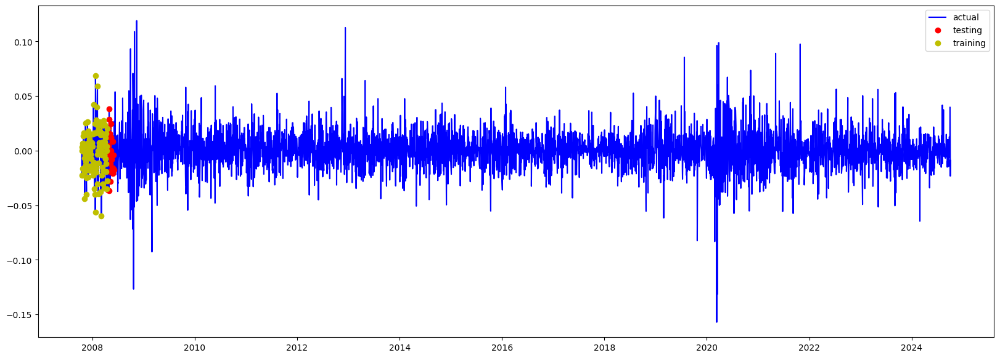

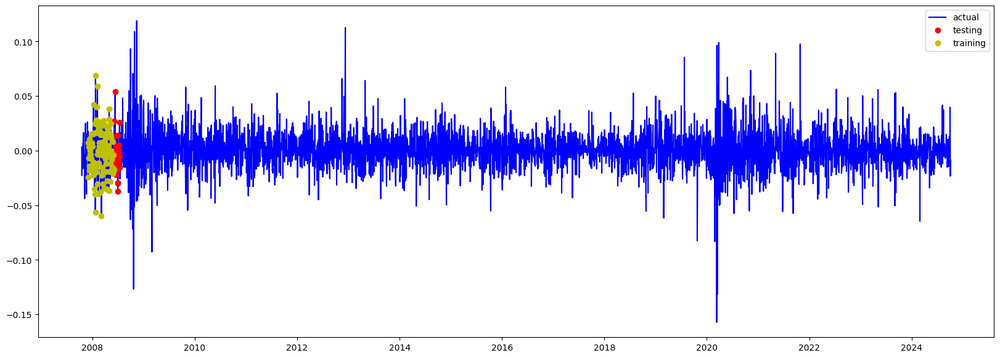

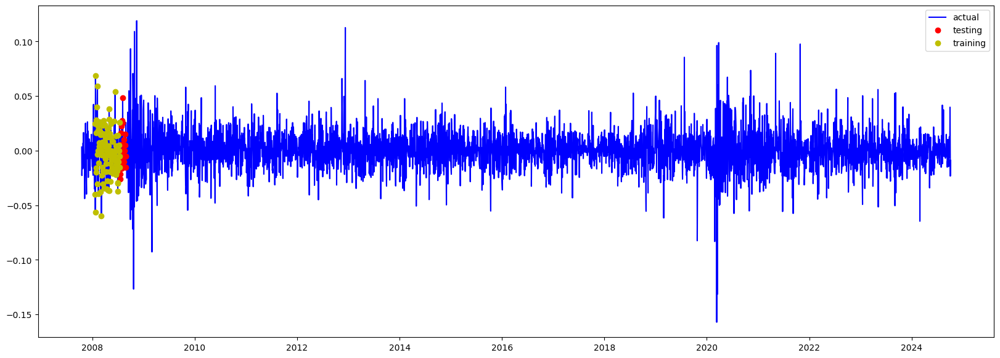

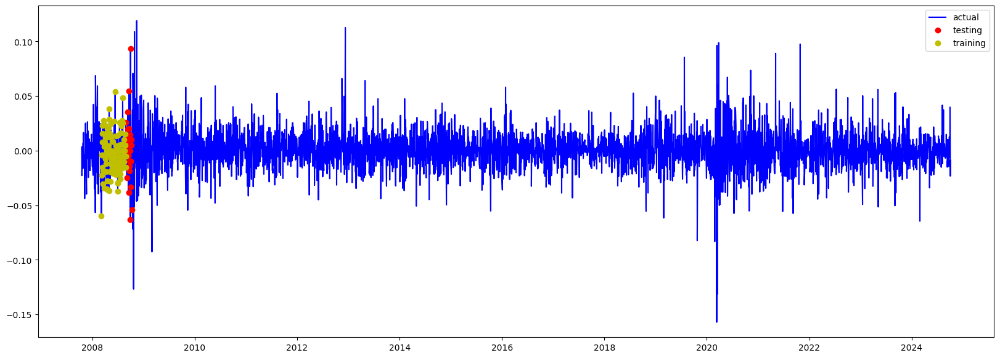

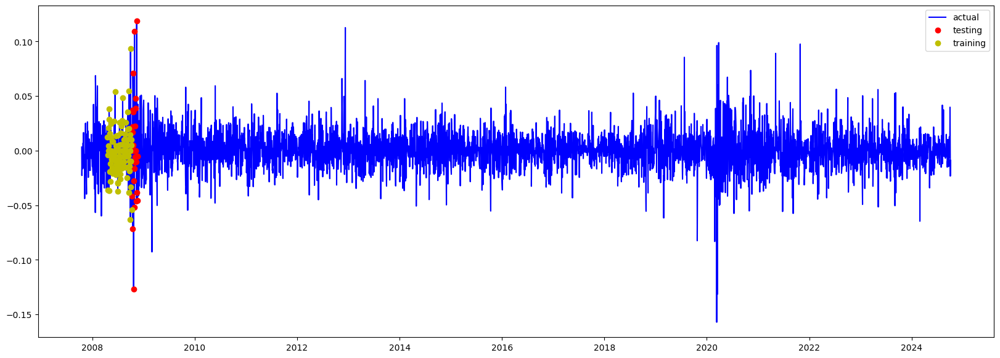

In [58]:
cv = SlidingWindowExclusiveTestCV(120, 30)

count = 0

tests = []
trains = []

df = preprocess_data(stocks_df, "abev3")

for train_index, test_index in cv.split(df["Return_abev3"]):
    X_train, X_test = df["Return_abev3"].iloc[train_index], df["Return_abev3"].iloc[test_index]

    tests.append(X_test)
    trains.append(X_train)

    # if count == 0 or count % 10 == 0:
    if count in range(5):
        plt.figure(figsize=(20, 7))
        # plt.title(regression_metrics(y_test, y_test_pred))
        plt.plot(df.index, df["Return_abev3"], 'b-', label = 'actual')
        plt.plot(X_test.index, X_test, 'ro', label = 'testing')
        plt.plot(X_train.index, X_train, 'yo', label = 'training')
        plt.legend()
        plt.plot()

    count += 1

assert check_time_index_overlap(tests) == False
assert type(tests[0]) == pd.Series
assert trains[0].index[0] == df["Return_abev3"].index[0]

In [59]:
tests[0].index[-1], tests[1].index[0], tests[1].index[-1], tests[2].index[0], tests[2].index[-1], tests[3].index[0]

(Timestamp('2008-06-03 00:00:00'),
 Timestamp('2008-06-04 00:00:00'),
 Timestamp('2008-07-16 00:00:00'),
 Timestamp('2008-07-17 00:00:00'),
 Timestamp('2008-08-27 00:00:00'),
 Timestamp('2008-08-28 00:00:00'))

In [60]:
trains[1].index[-1], tests[1].index[0], trains[2].index[-1], tests[2].index[0], trains[3].index[-1], tests[3].index[0]

(Timestamp('2008-06-03 00:00:00'),
 Timestamp('2008-06-04 00:00:00'),
 Timestamp('2008-07-16 00:00:00'),
 Timestamp('2008-07-17 00:00:00'),
 Timestamp('2008-08-27 00:00:00'),
 Timestamp('2008-08-28 00:00:00'))

treino e teste nao aparentam estar vazando um no outro

In [61]:
def print_simple_metrics(results):
    accs = [i["accuracy"] for i in results]
    print("accuracy: ", np.array(accs).mean())

    f1 = [i["f1"] for i in results]
    print("f1: ", np.array(f1).mean())

    precisions = [i["precision"] for i in results]
    print("precision: ", np.array(precisions).mean())

    recalls = [i["recall"] for i in results]
    print("recall: ", np.array(recalls).mean())

# LSTM

## Exp 01

In [62]:
LSTM_NUM_EXPERIMENTS = 1
LSTM_HIDDEN_UNITS = 1

TRAIN_SIZE = 120
VAL_SIZE = 30

In [63]:
def define_lstm(data_shape, num_units):
    lstm = Sequential()

    lstm.add(Input(shape=data_shape))
    lstm.add(LSTM(num_units))
    lstm.add(Dense(1, activation="sigmoid"))

    lstm.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])

    return lstm

In [64]:
early_stopping = EarlyStopping(
    monitor='val_accuracy',
    patience=25,
    restore_best_weights=True,
	mode='max'
)

def run_n_lstm_experiments(n_exps: int, train_size: int, val_size: int, stock: str, num_units: int):
    all_runs_tests = []
    results = []

    for i in range(n_exps):
        np.random.seed(i)
        random.seed(i)
        tf.random.set_seed(i)

        data = preprocess_data(stocks_df, stock)

        X = data.drop([f"{stock}_y"], axis=1)
        y_ground = data[f"{stock}_y"]

        model = define_lstm((X.shape[1], 1), num_units)
        cv_splitter = SlidingWindowExclusiveTestCV(train_size, val_size)

        tests = []

        for train_index, test_index in cv_splitter.split(X):
            X_train, X_test = X.iloc[train_index], X.iloc[test_index]
            y_train, y_test = y_ground.iloc[train_index], y_ground.iloc[test_index]

            # tests.append(X_test)
            trains.append(X_train)

            scaler = StandardScaler()
            X_train = scaler.fit_transform(X_train)
            X_test = scaler.fit_transform(X_test)

            history = model.fit(
                X_train, y_train,
                epochs = 750,
                batch_size=16,
                # validation_data=(X_test, y_test),
                validation_split=0.2,
                callbacks=[early_stopping],
                shuffle=False,
                verbose=False
            )

            # results.append(history.history)

            y_hat = model.predict(X_test, verbose=False)

            y_hat = np.array(y_hat)
            for i in range(len(y_hat)):
                if y_hat[i] > 0.5:
                    y_hat[i] = True
                else:
                    y_hat[i] = False

            for i, y in enumerate(y_hat):
                tests.append({y_test.index[i]: y})
                
            results.append({
                "accuracy": accuracy_score(y_test, y_hat),
                "f1": f1_score(y_test, y_hat),
                "precision": precision_score(y_test, y_hat, zero_division=0),
                "recall": recall_score(y_test, y_hat)
            })
        
        all_runs_tests.append(tests)

    # all_accs.append(np.array(accs).mean())
    np.random.seed(RANDOM_STATE)
    random.seed(RANDOM_STATE)
    tf.random.set_seed(RANDOM_STATE)

    return results, all_runs_tests

In [65]:
abev3_lstm_res, abev3_preds = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "abev3", 
    LSTM_HIDDEN_UNITS
)
print_simple_metrics(abev3_lstm_res)

2024-11-08 14:07:53.484877: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


accuracy:  0.5186274509803921
f1:  0.23719928280756075
precision:  0.5027135854341737
recall:  0.16339468820375078


In [66]:
abev3_preds[0][-1]

{Timestamp('2024-09-25 00:00:00'): array([1.], dtype=float32)}

In [67]:
bbdc3_lstm_res, bbdc3_preds = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "bbdc3", 
    LSTM_HIDDEN_UNITS
)
print_simple_metrics(bbdc3_lstm_res)

accuracy:  0.5147058823529411
f1:  0.410436851412238
precision:  0.5171675750719869
recall:  0.3552888435537068


In [68]:
itsa3_lstm_res, itsa3_preds = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "itsa3", 
    LSTM_HIDDEN_UNITS
)
print_simple_metrics(itsa3_lstm_res)

accuracy:  0.5362745098039214
f1:  0.25654462764745
precision:  0.5334778579263874
recall:  0.18517867363392995


In [69]:
itub3_lstm_res, itub3_preds = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "itub3", 
    LSTM_HIDDEN_UNITS
)
print_simple_metrics(itub3_lstm_res)

accuracy:  0.5178921568627451
f1:  0.45817556984345814
precision:  0.5228277823385158
recall:  0.42647017070249404


In [70]:
wege3_lstm_res, wege3_preds = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "wege3", 
    LSTM_HIDDEN_UNITS
)
print_simple_metrics(wege3_lstm_res)

accuracy:  0.5127450980392156
f1:  0.3049430459719369
precision:  0.5230563554092965
recall:  0.2401769178483347


### Construindo a comparação de portfolio

In [ ]:
def compute_sharpe_ratio(portfolio_daily_returns):
    risk_free_daily_rate = 0.00026115787606784124  # considering SELIC at an arbitrary avg of 10% year

    avg_return = portfolio_daily_returns.mean()
    std_dev_return = portfolio_daily_returns.std()

    return (avg_return - risk_free_daily_rate) / std_dev_return

In [72]:
return_cols = [col for col in stocks_df.columns.tolist() if "Return" in col and "lag" not in col]
return_cols

['Return_abev3',
 'Return_bbdc3',
 'Return_itub3',
 'Return_itsa3',
 'Return_wege3']

In [73]:
list(abev3_preds[0][0].keys())[0], list(bbdc3_preds[0][0].keys())[0], list(itsa3_preds[0][0].keys())[0], list(wege3_preds[0][0].keys())[0]

(Timestamp('2008-04-18 00:00:00'),
 Timestamp('2008-04-18 00:00:00'),
 Timestamp('2008-04-18 00:00:00'),
 Timestamp('2008-04-18 00:00:00'))

In [74]:
list(abev3_preds[0][-1].keys())[0], list(bbdc3_preds[0][-1].keys())[0], list(itsa3_preds[0][-1].keys())[0], list(wege3_preds[0][-1].keys())[0]

(Timestamp('2024-09-25 00:00:00'),
 Timestamp('2024-09-25 00:00:00'),
 Timestamp('2024-09-25 00:00:00'),
 Timestamp('2024-09-25 00:00:00'))

Séries começam e terminam no mesmo ponto

In [75]:
start_date1 = list(abev3_preds[0][0].keys())[0]
end_date1 = list(abev3_preds[0][-1].keys())[0]

In [76]:
daily_returns = stocks_df[return_cols].loc[start_date1 : end_date1]
daily_returns

,Return_abev3,Return_bbdc3,Return_itub3,Return_itsa3,Return_wege3
Date,,,,,
2008-04-18,0.012146,0.007505,0.025788,-0.029070,-0.014634
2008-04-22,-0.036000,-0.007449,-0.009777,-0.008982,0.000000
2008-04-23,-0.004149,0.001876,-0.012694,-0.015106,-0.039604
2008-04-24,0.004167,0.005618,-0.002857,-0.003067,-0.015464
2008-04-25,0.020747,0.011173,-0.022923,0.006154,0.020942
...,...,...,...,...,...
2024-09-19,-0.002311,-0.010279,-0.007190,0.006312,-0.001877
2024-09-20,-0.014672,-0.017062,-0.015743,-0.022401,-0.013912
2024-09-23,-0.000784,-0.024151,-0.001599,-0.008249,0.034318


In [77]:
# Define portfolio weights (example: equal weights for each stock)
weights = np.array([0.2, 0.2, 0.2, 0.2, 0.2])

# Calculate daily portfolio returns
portfolio_returns = daily_returns.dot(weights)

# Calculate cumulative returns
cumulative_returns = (1 + portfolio_returns).cumprod()

# Convert to DataFrame for plotting
cumulative_returns_df = pd.DataFrame({'Cumulative Return': cumulative_returns}, index=daily_returns.index)

# Plot using Plotly Express
fig = px.line(cumulative_returns_df, y='Cumulative Return', title='Buy and Hold Portfolio Cumulative Performance Over Time')
fig.show()

In [78]:
buy_and_hold_sharpe = compute_sharpe_ratio(portfolio_returns)
buy_and_hold_sharpe

0.02422434991802179

In [79]:
daily_returns

,Return_abev3,Return_bbdc3,Return_itub3,Return_itsa3,Return_wege3
Date,,,,,
2008-04-18,0.012146,0.007505,0.025788,-0.029070,-0.014634
2008-04-22,-0.036000,-0.007449,-0.009777,-0.008982,0.000000
2008-04-23,-0.004149,0.001876,-0.012694,-0.015106,-0.039604
2008-04-24,0.004167,0.005618,-0.002857,-0.003067,-0.015464
2008-04-25,0.020747,0.011173,-0.022923,0.006154,0.020942
...,...,...,...,...,...
2024-09-19,-0.002311,-0.010279,-0.007190,0.006312,-0.001877
2024-09-20,-0.014672,-0.017062,-0.015743,-0.022401,-0.013912
2024-09-23,-0.000784,-0.024151,-0.001599,-0.008249,0.034318


In [80]:
daily_returns

,Return_abev3,Return_bbdc3,Return_itub3,Return_itsa3,Return_wege3
Date,,,,,
2008-04-18,0.012146,0.007505,0.025788,-0.029070,-0.014634
2008-04-22,-0.036000,-0.007449,-0.009777,-0.008982,0.000000
2008-04-23,-0.004149,0.001876,-0.012694,-0.015106,-0.039604
2008-04-24,0.004167,0.005618,-0.002857,-0.003067,-0.015464
2008-04-25,0.020747,0.011173,-0.022923,0.006154,0.020942
...,...,...,...,...,...
2024-09-19,-0.002311,-0.010279,-0.007190,0.006312,-0.001877
2024-09-20,-0.014672,-0.017062,-0.015743,-0.022401,-0.013912
2024-09-23,-0.000784,-0.024151,-0.001599,-0.008249,0.034318


In [81]:
inclusion_mask = pd.DataFrame({
    'Return_abev3': pd.Series([list(val.values())[0][0] for val in abev3_preds[0]], index=[list(val.keys())[0] for val in abev3_preds[0]]),
    'Return_bbdc3': pd.Series([list(val.values())[0][0] for val in bbdc3_preds[0]], index=[list(val.keys())[0] for val in bbdc3_preds[0]]),
    'Return_itsa3': pd.Series([list(val.values())[0][0] for val in itsa3_preds[0]], index=[list(val.keys())[0] for val in itsa3_preds[0]]),
    'Return_itub3': pd.Series([list(val.values())[0][0] for val in itub3_preds[0]], index=[list(val.keys())[0] for val in itub3_preds[0]]),
    'Return_wege3': pd.Series([list(val.values())[0][0] for val in wege3_preds[0]], index=[list(val.keys())[0] for val in wege3_preds[0]]),
})

inclusion_mask.shift(1)

,Return_abev3,Return_bbdc3,Return_itsa3,Return_itub3,Return_wege3
2008-04-18,NaN,NaN,NaN,NaN,NaN
2008-04-22,0.0,1.0,0.0,0.0,1.0
2008-04-23,0.0,0.0,0.0,0.0,1.0
2008-04-24,0.0,0.0,0.0,0.0,1.0
2008-04-25,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...
2024-09-19,1.0,1.0,1.0,1.0,0.0
2024-09-20,0.0,1.0,1.0,1.0,0.0
2024-09-23,0.0,1.0,1.0,1.0,1.0
2024-09-24,0.0,1.0,1.0,1.0,0.0


In [82]:
def compute_buyandhold_cumulative_returns(returns_series):
    # Define portfolio weights (example: equal weights for each stock)
    weights = np.array([0.2, 0.2, 0.2, 0.2, 0.2])

    # Calculate daily portfolio returns
    portfolio_returns = returns_series.dot(weights)

    # Calculate cumulative returns
    cumulative_returns = (1 + portfolio_returns).cumprod()

    # Convert to DataFrame for plotting
    cumulative_returns_df = pd.DataFrame({'Cumulative Return': cumulative_returns}, index=returns_series.index)

    return cumulative_returns_df, portfolio_returns

In [83]:
def compute_cumulative_returns_pred(abev3_preds, bbdc3_preds, itsa3_preds, itub3_preds, wege3_preds):
    inclusion_mask = pd.DataFrame({
    'Return_abev3': pd.Series([list(val.values())[0][0] for val in abev3_preds[0]], index=[list(val.keys())[0] for val in abev3_preds[0]]),
    'Return_bbdc3': pd.Series([list(val.values())[0][0] for val in bbdc3_preds[0]], index=[list(val.keys())[0] for val in bbdc3_preds[0]]),
    'Return_itsa3': pd.Series([list(val.values())[0][0] for val in itsa3_preds[0]], index=[list(val.keys())[0] for val in itsa3_preds[0]]),
    'Return_itub3': pd.Series([list(val.values())[0][0] for val in itub3_preds[0]], index=[list(val.keys())[0] for val in itub3_preds[0]]),
    'Return_wege3': pd.Series([list(val.values())[0][0] for val in wege3_preds[0]], index=[list(val.keys())[0] for val in wege3_preds[0]]),
    })

    # Apply mask to daily returns
    adjusted_returns = daily_returns * inclusion_mask.shift(1)
    adjusted_returns = adjusted_returns.dropna(axis=0)

    # Adjust weights based on inclusion mask
    effective_weights = inclusion_mask * weights  # Set weight to 0 for excluded stocks

    # # Normalize weights so they sum up to 1 for each day
    normalized_weights = effective_weights.div(effective_weights.sum(axis=1), axis=0).fillna(0)

    # Calculate daily portfolio returns with adjusted weights
    portfolio_returns = (adjusted_returns * normalized_weights).sum(axis=1)

    # # Step 6: Calculate cumulative returns
    cumulative_returns_pred = (1 + portfolio_returns).cumprod()

    # # Convert to DataFrame for plotting
    cumulative_returns_pred_df = pd.DataFrame({'Cumulative Return': cumulative_returns_pred}, index=daily_returns.index)

    return cumulative_returns_pred_df, portfolio_returns

In [84]:
def plot_cumulative_returns_line_chart(series):
    fig = px.line(series, y='Cumulative Return', title='Portfolio Cumulative Performance Over Time')
    fig.show()

In [85]:
exp1_cuml_returns, lstm_returns1 = compute_cumulative_returns_pred(abev3_preds, bbdc3_preds, itsa3_preds, itub3_preds, wege3_preds)
plot_cumulative_returns_line_chart(exp1_cuml_returns)

In [86]:
def plot_two_returns_series(series1, series2, label1, label2, index, title="Portfolio Comparison between Buy & Hold and Model"):
    plt.figure(figsize=(20, 7))
    plt.plot(index, series1, 'b-', label = label1)
    plt.plot(index, series2, 'r-', label = label2)
    plt.title(title)
    plt.legend()

    for i, series in enumerate([series1, series2]):
        max_idx = np.nanargmax(series)
        min_idx = np.nanargmin(series)

        print(series.to_numpy()[min_idx])

        plt.annotate(
            f"Max: {series.to_numpy()[max_idx]}",
            (series.index[max_idx], series.to_numpy()[max_idx]),
            xytext=(series.index[max_idx], series.to_numpy()[max_idx] + 0.5),
            arrowprops=dict(facecolor='green', arrowstyle='->'),
            color='green',
        )

        plt.annotate(
            f"Min: {series.to_numpy()[min_idx]}",
            (series.index[min_idx], series.to_numpy()[min_idx]),
            xytext=(series.index[min_idx], series.to_numpy()[min_idx] - (i+1)*2),
            arrowprops=dict(facecolor='red', arrowstyle='->'),
            color='red',
        )

    plt.plot()

[0.66166316]
[0.5940447]


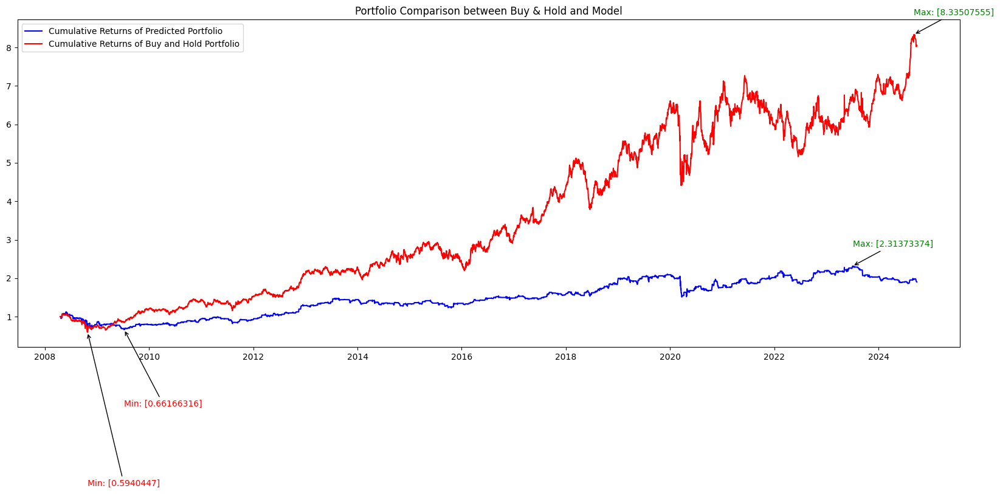

In [87]:
buy_and_hold1, _ = compute_buyandhold_cumulative_returns(stocks_df[return_cols].loc[start_date1 : end_date1])

plot_two_returns_series(
    exp1_cuml_returns, 
    buy_and_hold1,
    "Cumulative Returns of Predicted Portfolio", 
    "Cumulative Returns of Buy and Hold Portfolio", 
    daily_returns.index
)

In [88]:
compute_sharpe_ratio(lstm_returns1), buy_and_hold_sharpe

(-0.004609335684011216, 0.02422434991802179)

## Exp 2

In [89]:
LSTM_HIDDEN_UNITS_2 = 4

In [90]:
abev3_lstm_res2, abev3_preds2 = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "abev3", 
    LSTM_HIDDEN_UNITS_2
)
print_simple_metrics(abev3_lstm_res2)

accuracy:  0.5161764705882352
f1:  0.37256702748327875
precision:  0.5031261936592818
recall:  0.3148643185362362


In [91]:
bbdc3_lstm_res2, bbdc3_preds2 = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "bbdc3", 
    LSTM_HIDDEN_UNITS_2
)
print_simple_metrics(bbdc3_lstm_res2)

accuracy:  0.5171568627450981
f1:  0.44706448035740753
precision:  0.5149682874883771
recall:  0.4155846960197014


In [92]:
itsa3_lstm_res2, itsa3_preds2 = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "itsa3", 
    LSTM_HIDDEN_UNITS_2
)
print_simple_metrics(itsa3_lstm_res2)

accuracy:  0.5441176470588235
f1:  0.3279010931012757
precision:  0.5394752521932226
recall:  0.2706412380808552


In [93]:
itub3_lstm_res2, itub3_preds2 = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "itub3", 
    LSTM_HIDDEN_UNITS_2
)
print_simple_metrics(itub3_lstm_res2)

accuracy:  0.5247549019607843
f1:  0.484486897075835
precision:  0.5220090389890972
recall:  0.478109068907933


In [94]:
wege3_lstm_res2, wege3_preds2 = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "wege3", 
    LSTM_HIDDEN_UNITS_2
)
print_simple_metrics(wege3_lstm_res2)

accuracy:  0.5112745098039215
f1:  0.1960136102333381
precision:  0.3598027147064777
recall:  0.16751141486475443


In [95]:
exp2_cuml_returns, lstm_returns2 = compute_cumulative_returns_pred(abev3_preds2, bbdc3_preds2, itsa3_preds2, itub3_preds2, wege3_preds2)
plot_cumulative_returns_line_chart(exp2_cuml_returns)

[0.90565402]
[0.5940447]


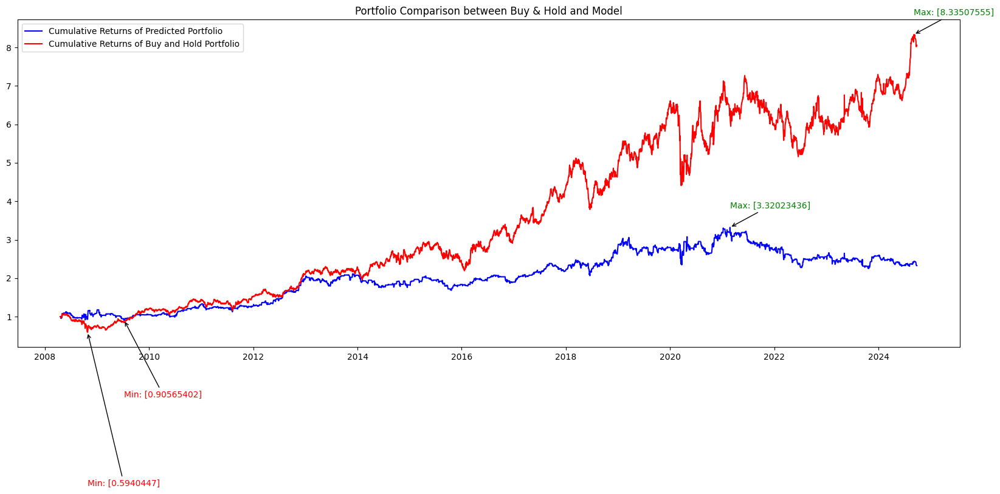

In [96]:
plot_two_returns_series(
    exp2_cuml_returns, 
    buy_and_hold1,
    "Cumulative Returns of Predicted Portfolio", 
    "Cumulative Returns of Buy and Hold Portfolio", 
    daily_returns.index
)

In [97]:
compute_sharpe_ratio(lstm_returns2), buy_and_hold_sharpe

(0.001235672510615503, 0.02422434991802179)

## Exp 3

In [98]:
LSTM_HIDDEN_UNITS_3 = 8

In [99]:
abev3_lstm_res3, abev3_preds3 = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "abev3", 
    LSTM_HIDDEN_UNITS_3
)
print_simple_metrics(abev3_lstm_res3)

accuracy:  0.5166666666666666
f1:  0.30534980895097846
precision:  0.4959169302919303
recall:  0.24240552713793015


In [100]:
bbdc3_lstm_res3, bbdc3_preds3 = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "bbdc3", 
    LSTM_HIDDEN_UNITS_3
)
print_simple_metrics(bbdc3_lstm_res3)

accuracy:  0.5078431372549019
f1:  0.37056298535288795
precision:  0.5129157769765696
recall:  0.32049384537830305


In [101]:
itsa3_lstm_res3, itsa3_preds3 = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "itsa3", 
    LSTM_HIDDEN_UNITS_3
)
print_simple_metrics(itsa3_lstm_res3)

accuracy:  0.5504901960784313
f1:  0.29111723698636094
precision:  0.42160019310754604
recall:  0.23969550796261552


In [102]:
itub3_lstm_res3, itub3_preds3 = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "itub3", 
    LSTM_HIDDEN_UNITS_3
)
print_simple_metrics(itub3_lstm_res3)

accuracy:  0.5112745098039215
f1:  0.333474024080315
precision:  0.4379646001547428
recall:  0.31789317670532385


In [103]:
wege3_lstm_res3, wege3_preds3 = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "wege3", 
    LSTM_HIDDEN_UNITS_3
)
print_simple_metrics(wege3_lstm_res3)

accuracy:  0.5105392156862746
f1:  0.19333255096620655
precision:  0.3647708574244611
recall:  0.17498539386942


In [104]:
exp3_cuml_returns, lstm_returns3 = compute_cumulative_returns_pred(abev3_preds3, bbdc3_preds3, itsa3_preds3, itub3_preds3, wege3_preds3)
plot_cumulative_returns_line_chart(exp3_cuml_returns)

[0.06197407]
[0.5940447]


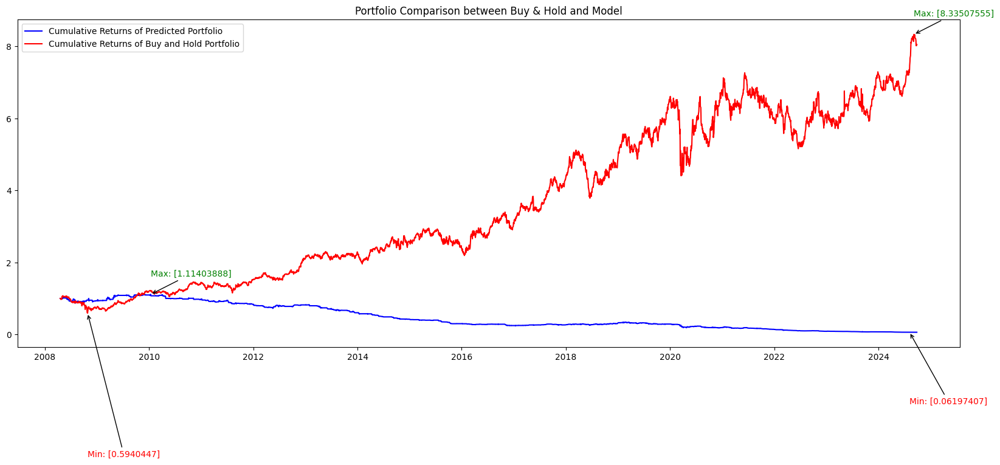

In [105]:
plot_two_returns_series(
    exp3_cuml_returns, 
    buy_and_hold1,
    "Cumulative Returns of Predicted Portfolio", 
    "Cumulative Returns of Buy and Hold Portfolio", 
    daily_returns.index
)

In [106]:
compute_sharpe_ratio(lstm_returns3), buy_and_hold_sharpe

(-0.09503142011536572, 0.02422434991802179)

## Exp 4

In [107]:
LSTM_HIDDEN_UNITS_4 = 4
TRAIN_SIZE_4 = 240

In [108]:
abev3_lstm_res4, abev3_preds4 = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE_4, 
    VAL_SIZE, 
    "abev3", 
    LSTM_HIDDEN_UNITS_4
)
print_simple_metrics(abev3_lstm_res4)

accuracy:  0.521969696969697
f1:  0.39217562581878374
precision:  0.508896943847009
recall:  0.35436828962986433


In [109]:
bbdc3_lstm_res4, bbdc3_preds4 = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE_4, 
    VAL_SIZE, 
    "bbdc3", 
    LSTM_HIDDEN_UNITS_4
)
print_simple_metrics(bbdc3_lstm_res4)

accuracy:  0.5176767676767675
f1:  0.4474104729288882
precision:  0.5242761706023387
recall:  0.4252598629911051


In [110]:
itsa3_lstm_res4, itsa3_preds4 = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE_4, 
    VAL_SIZE, 
    "itsa3", 
    LSTM_HIDDEN_UNITS_4
)
print_simple_metrics(itsa3_lstm_res4)

accuracy:  0.5484848484848486
f1:  0.31758695731463094
precision:  0.5549687111017324
recall:  0.26327693822944315


In [111]:
itub3_lstm_res4, itub3_preds4 = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE_4, 
    VAL_SIZE, 
    "itub3", 
    LSTM_HIDDEN_UNITS_4
)
print_simple_metrics(itub3_lstm_res4)

accuracy:  0.5252525252525252
f1:  0.49340695694008735
precision:  0.5324275443195156
recall:  0.5015286698582505


In [112]:
wege3_lstm_res4, wege3_preds4 = run_n_lstm_experiments(
    LSTM_NUM_EXPERIMENTS, 
    TRAIN_SIZE_4, 
    VAL_SIZE, 
    "wege3", 
    LSTM_HIDDEN_UNITS_4
)
print_simple_metrics(wege3_lstm_res4)

accuracy:  0.5017676767676768
f1:  0.15643876286212144
precision:  0.2526488311737732
recall:  0.1644523027412487


In [113]:
exp4_cuml_returns, lstm_returns4 = compute_cumulative_returns_pred(abev3_preds4, bbdc3_preds4, itsa3_preds4, itub3_preds4, wege3_preds4)
plot_cumulative_returns_line_chart(exp4_cuml_returns)

In [114]:
start_date4 = list(abev3_preds4[0][0].keys())[0]
end_date4 = list(abev3_preds4[0][-1].keys())[0]

[0.81227818]
[0.5940447]


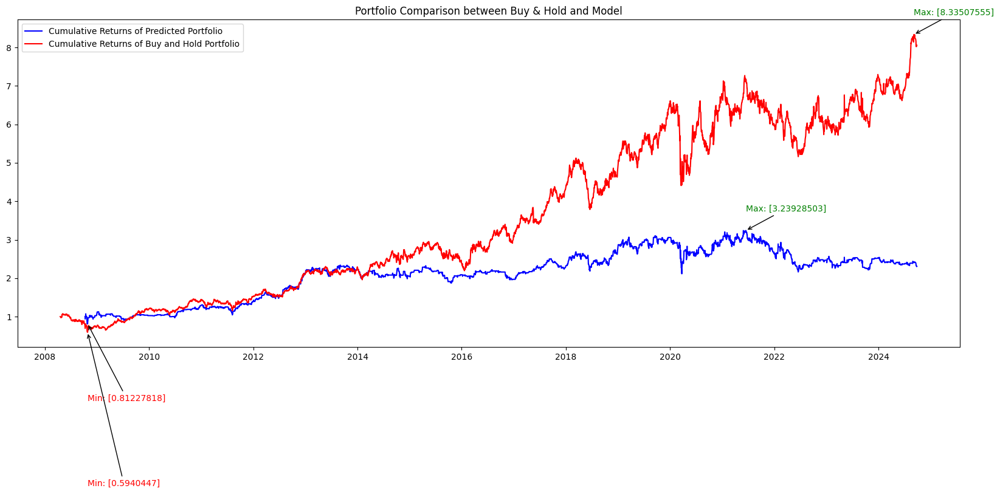

In [115]:
buy_and_hold4, _ = compute_buyandhold_cumulative_returns(stocks_df[return_cols].loc[start_date4 : end_date4])

plot_two_returns_series(
    exp4_cuml_returns, 
    buy_and_hold1,
    "Cumulative Returns of Predicted Portfolio", 
    "Cumulative Returns of Buy and Hold Portfolio", 
    daily_returns.index
)

In [116]:
compute_sharpe_ratio(lstm_returns4), buy_and_hold_sharpe

(0.0019507509518182841, 0.02422434991802179)

## Discussão

A LSTM não é capaz de superar o Buy & Hold em nenhuma ocasião, fato confirmado pelo Sharpe Ratio inferior ao Buy & Hold, inclusive gerando prejuízos quando se usa 8 unidades escondidas. Existe um argumento que LSTMs não são ideais para séries temporais, especialmente séries univariadas. https://machinelearningmastery.com/suitability-long-short-term-memory-networks-time-series-forecasting/

Além disso, cabe ressaltar que o Sharpe Ratio não é ideal nem para o Buy & Hold, que encontra-se abaixo de 1. Isso indica que a volatilidade da carteira é alta demais para o retorno dela se comparada a um ativo de baixo risco como o Tesouro SELIC, rendendo a uma média arbitrária de 10% a.a. no mesmo período.

# GRU

In [117]:
def define_gru(data_shape, num_units):
    gru = Sequential()

    gru.add(Input(shape=data_shape))
    gru.add(GRU(num_units))
    gru.add(Dense(1, activation="sigmoid"))

    gru.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])

    return gru

In [118]:
def run_n_gru_experiments(n_exps: int, train_size: int, val_size: int, stock: str, num_units: int):
    all_runs_tests = []
    results = []

    for i in range(n_exps):
        np.random.seed(i)
        random.seed(i)
        tf.random.set_seed(i)

        data = preprocess_data(stocks_df, stock)

        X = data.drop([f"{stock}_y"], axis=1)
        y_ground = data[f"{stock}_y"]

        model = define_gru((X.shape[1], 1), num_units)
        cv_splitter = SlidingWindowExclusiveTestCV(train_size, val_size)

        tests = []

        for train_index, test_index in cv_splitter.split(X):
            X_train, X_test = X.iloc[train_index], X.iloc[test_index]
            y_train, y_test = y_ground.iloc[train_index], y_ground.iloc[test_index]

            # tests.append(X_test)
            trains.append(X_train)

            scaler = StandardScaler()
            X_train = scaler.fit_transform(X_train)
            X_test = scaler.fit_transform(X_test)

            history = model.fit(
                X_train, y_train,
                epochs = 750,
                batch_size=16,
                # validation_data=(X_test, y_test),
                validation_split=0.2,
                callbacks=[early_stopping],
                shuffle=False,
                verbose=False
            )

            # results.append(history.history)

            y_hat = model.predict(X_test, verbose=False)

            y_hat = np.array(y_hat)
            for i in range(len(y_hat)):
                if y_hat[i] > 0.5:
                    y_hat[i] = True
                else:
                    y_hat[i] = False

            for i, y in enumerate(y_hat):
                tests.append({y_test.index[i]: y})
                
            results.append({
                "accuracy": accuracy_score(y_test, y_hat),
                "f1": f1_score(y_test, y_hat),
                "precision": precision_score(y_test, y_hat, zero_division=0),
                "recall": recall_score(y_test, y_hat)
            })
        
        all_runs_tests.append(tests)

    # all_accs.append(np.array(accs).mean())
    np.random.seed(RANDOM_STATE)
    random.seed(RANDOM_STATE)
    tf.random.set_seed(RANDOM_STATE)

    return results, all_runs_tests

## Exp 01

In [119]:
GRU_NUM_EXPERIMENTS = 1
GRU_HIDDEN_UNITS = 1

In [120]:
abev3_gru_res, abev3_gru_preds = run_n_gru_experiments(
    GRU_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "abev3", 
    GRU_HIDDEN_UNITS
)
print_simple_metrics(abev3_gru_res)

accuracy:  0.5125000000000001
f1:  0.42780917624848985
precision:  0.4979720719015701
recall:  0.38808468786671757


In [121]:
bbdc3_gru_res, bbdc3_gru_preds = run_n_gru_experiments(
    GRU_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "bbdc3", 
    GRU_HIDDEN_UNITS
)
print_simple_metrics(bbdc3_gru_res)

accuracy:  0.5083333333333333
f1:  0.4648305878939647
precision:  0.5077185955814052
recall:  0.4426028908469295


In [122]:
itsa3_gru_res, itsa3_gru_preds = run_n_gru_experiments(
    GRU_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "itsa3", 
    GRU_HIDDEN_UNITS
)
print_simple_metrics(itsa3_gru_res)

accuracy:  0.5276960784313725
f1:  0.31604984967581773
precision:  0.5059887212460742
recall:  0.24990688800616412


In [123]:
itub3_gru_res, itub3_gru_preds = run_n_gru_experiments(
    GRU_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "itub3", 
    GRU_HIDDEN_UNITS
)
print_simple_metrics(itub3_gru_res)

accuracy:  0.5193627450980391
f1:  0.4942831814498194
precision:  0.5232587931820198
recall:  0.48479599997424616


In [124]:
wege3_gru_res, wege3_gru_preds = run_n_gru_experiments(
    GRU_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "wege3", 
    GRU_HIDDEN_UNITS
)
print_simple_metrics(wege3_gru_res)

accuracy:  0.5075980392156862
f1:  0.37151548278030333
precision:  0.4970092107527228
recall:  0.3198884029109057


In [125]:
exp1_gru_cuml_returns, gru_returns1 = compute_cumulative_returns_pred(abev3_gru_preds, bbdc3_gru_preds, itsa3_gru_preds, itub3_gru_preds, wege3_gru_preds)
plot_cumulative_returns_line_chart(exp1_gru_cuml_returns)

[0.68995868]
[0.5940447]


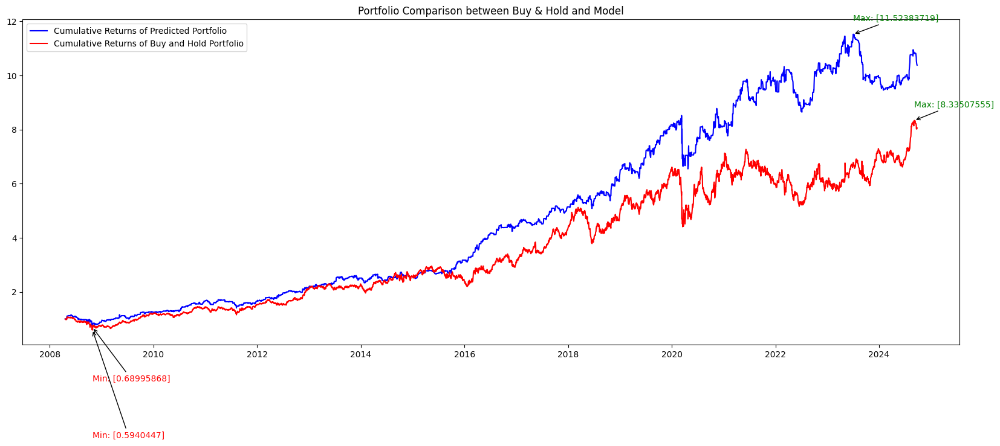

In [126]:
plot_two_returns_series(
    exp1_gru_cuml_returns, 
    buy_and_hold1,
    "Cumulative Returns of Predicted Portfolio", 
    "Cumulative Returns of Buy and Hold Portfolio", 
    daily_returns.index
)

In [127]:
compute_sharpe_ratio(gru_returns1), buy_and_hold_sharpe

(0.03475626897187407, 0.02422434991802179)

## Exp 02

In [128]:
GRU_HIDDEN_UNITS_2 = 4

In [129]:
abev3_gru_res2, abev3_gru_preds2 = run_n_gru_experiments(
    GRU_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "abev3", 
    GRU_HIDDEN_UNITS_2
)
print_simple_metrics(abev3_gru_res2)

accuracy:  0.5147058823529411
f1:  0.34539236527789635
precision:  0.49846479092802615
recall:  0.28272602557426585


In [130]:
bbdc3_gru_res2, bbdc3_gru_preds2 = run_n_gru_experiments(
    GRU_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "bbdc3", 
    GRU_HIDDEN_UNITS_2
)
print_simple_metrics(bbdc3_gru_res2)

accuracy:  0.508578431372549
f1:  0.44212189244543787
precision:  0.5053408821039945
recall:  0.4158052008239667


In [131]:
itsa3_gru_res2, itsa3_gru_preds2 = run_n_gru_experiments(
    GRU_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "itsa3", 
    GRU_HIDDEN_UNITS_2
)
print_simple_metrics(itsa3_gru_res2)

accuracy:  0.5355392156862745
f1:  0.24759652604512533
precision:  0.5115931862255392
recall:  0.18818587053994992


In [132]:
itub3_gru_res2, itub3_gru_preds2 = run_n_gru_experiments(
    GRU_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "itub3", 
    GRU_HIDDEN_UNITS_2
)
print_simple_metrics(itub3_gru_res2)

accuracy:  0.5196078431372549
f1:  0.48075251395731344
precision:  0.5205349034337947
recall:  0.4744897939013879


In [133]:
wege3_gru_res2, wege3_gru_preds2 = run_n_gru_experiments(
    GRU_NUM_EXPERIMENTS, 
    TRAIN_SIZE, 
    VAL_SIZE, 
    "wege3", 
    GRU_HIDDEN_UNITS_2
)
print_simple_metrics(wege3_gru_res2)

accuracy:  0.5053921568627451
f1:  0.1807669715784789
precision:  0.31532630584699733
recall:  0.16349448808188108


In [134]:
exp2_gru_cuml_returns, gru_returns2 = compute_cumulative_returns_pred(abev3_gru_preds2, bbdc3_gru_preds2, itsa3_gru_preds2, itub3_gru_preds2, wege3_gru_preds2)
plot_cumulative_returns_line_chart(exp2_gru_cuml_returns)

[0.83960409]
[0.5940447]


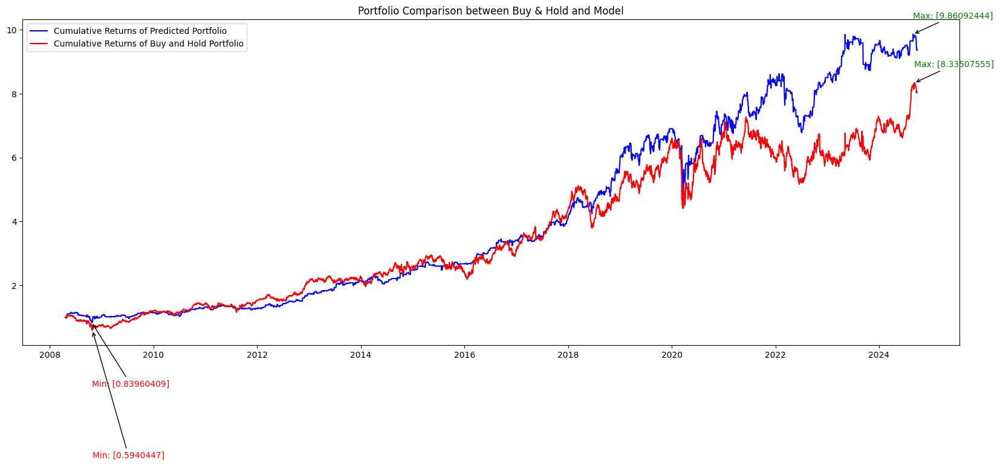

In [135]:
plot_two_returns_series(
    exp2_gru_cuml_returns, 
    buy_and_hold1,
    "Cumulative Returns of Predicted Portfolio", 
    "Cumulative Returns of Buy and Hold Portfolio", 
    daily_returns.index
)

In [136]:
compute_sharpe_ratio(gru_returns2), buy_and_hold_sharpe

(0.03287920064223932, 0.02422434991802179)

## Exp 03

In [137]:
abev3_gru_res3, abev3_gru_preds3 = run_n_gru_experiments(
    GRU_NUM_EXPERIMENTS, 
    TRAIN_SIZE_4, 
    VAL_SIZE, 
    "abev3", 
    GRU_HIDDEN_UNITS_2
)
print_simple_metrics(abev3_gru_res3)

accuracy:  0.51489898989899
f1:  0.34544499571997783
precision:  0.5131509097652988
recall:  0.3115789060518866


In [138]:
bbdc3_gru_res3, bbdc3_gru_preds3 = run_n_gru_experiments(
    GRU_NUM_EXPERIMENTS, 
    TRAIN_SIZE_4, 
    VAL_SIZE, 
    "bbdc3", 
    GRU_HIDDEN_UNITS_2
)
print_simple_metrics(bbdc3_gru_res3)

accuracy:  0.5156565656565656
f1:  0.43779275872963785
precision:  0.5261053632344508
recall:  0.4241477886133658


In [139]:
itsa3_gru_res3, itsa3_gru_preds3 = run_n_gru_experiments(
    GRU_NUM_EXPERIMENTS, 
    TRAIN_SIZE_4, 
    VAL_SIZE, 
    "itsa3", 
    GRU_HIDDEN_UNITS_2
)
print_simple_metrics(itsa3_gru_res3)

accuracy:  0.5378787878787878
f1:  0.26068130079195506
precision:  0.44028498981707537
recall:  0.22613825711560018


In [140]:
itub3_gru_res3, itub3_gru_preds3 = run_n_gru_experiments(
    GRU_NUM_EXPERIMENTS, 
    TRAIN_SIZE_4, 
    VAL_SIZE, 
    "itub3", 
    GRU_HIDDEN_UNITS_2
)
print_simple_metrics(itub3_gru_res3)

accuracy:  0.5222222222222221
f1:  0.4962959703476627
precision:  0.5249871628984606
recall:  0.5119964590649576


In [141]:
wege3_gru_res3, wege3_gru_preds3 = run_n_gru_experiments(
    GRU_NUM_EXPERIMENTS, 
    TRAIN_SIZE_4, 
    VAL_SIZE, 
    "wege3", 
    GRU_HIDDEN_UNITS_2
)
print_simple_metrics(wege3_gru_res3)

accuracy:  0.5088383838383838
f1:  0.14290546689836484
precision:  0.19820150566095776
recall:  0.16741887830404578


In [142]:
exp3_gru_cuml_returns, gru_returns3 = compute_cumulative_returns_pred(abev3_gru_preds3, bbdc3_gru_preds3, itsa3_gru_preds3, itub3_gru_preds3, wege3_gru_preds3)
plot_cumulative_returns_line_chart(exp3_gru_cuml_returns)

[0.73475927]
[0.5940447]


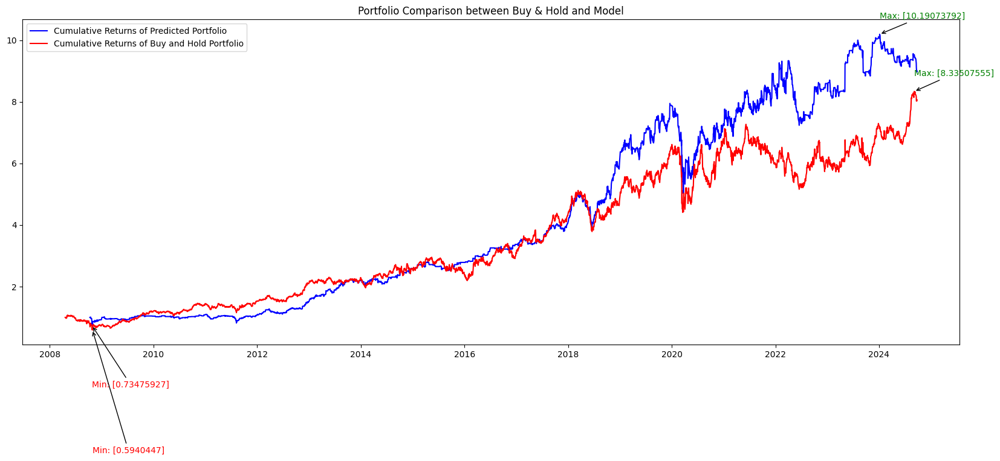

In [143]:
plot_two_returns_series(
    exp3_gru_cuml_returns, 
    buy_and_hold1,
    "Cumulative Returns of Predicted Portfolio", 
    "Cumulative Returns of Buy and Hold Portfolio", 
    daily_returns.index
)

In [144]:
compute_sharpe_ratio(gru_returns3), buy_and_hold_sharpe

(0.03047681954350857, 0.02422434991802179)

## Discussão

A rede GRU é imediatamente melhor que a LSTM para esse caso em todos os experimentos. Essa arquitetura, mais simples que a LSTM, funciona melhor para essa série univariada de sequências curtas e supera o Buy & Hold em todos os casos, especialmente com apenas 1 unidade na camada escondida. O Sharpe Ratio de qualquer portfolio da GRU supera o do Buy & Hold e todos da LSTM também. Os resultados obtidos com a GRU são promissores.

TODO:
- rodar n experimentos e plotar accs/sharpe ratios e std
- padronizar os dados no preprocessamento
- Avaliar sharpe ratio de diversas execuções ao invés de acurácia???? -> nem faz sentido avaliar acurácia: maior acurácia nao quer dizer melhor performance